# HOUSING:PRICE PREDICTION

### Problem Statement:

Houses are one of the necessary need of each and every person around the globe and therefore housing and real estate market is one of the markets which is one of the major contributors in the world’s economy. It is a very large market and there are various companies working in the domain. Data science comes as a very important tool to solve problems in the domain to help the companies increase their overall revenue, profits, improving their marketing strategies and focusing on changing trends in house sales and purchases. Predictive modelling, Market mix modelling, recommendation systems are some of the machine learning techniques used for achieving the business goals for housing companies. Our problem is related to one such housing company.
A US-based housing company named Surprise Housing has decided to enter the Australian market. The company uses data analytics to purchase houses at a price below their actual values and flip them at a higher price. For the same purpose, the company has collected a data set from the sale of houses in Australia. The data is provided in the CSV file below.
The company is looking at prospective properties to buy houses to enter the market. You are required to build a model using Machine Learning in order to predict the actual value of the prospective properties and decide whether to invest in them or not. For this company wants to know:

• Which variables are important to predict the price of variable?

• How do these variables describe the price of the house?

###### Business Goal:
You are required to model the price of houses with the available independent variables. This model will then be used by the management to understand how exactly the prices vary with the variables. They can accordingly manipulate the strategy of the firm and concentrate on areas that will yield high returns. Further, the model will be a good way for the management to understand the pricing dynamics of a new market.

#### Importing necessary Libraries

In [1]:
import pandas  as  pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

import os
import scipy as stats

import warnings
warnings.filterwarnings('ignore')

In [7]:
# To display maximum rows and columns in the dataset
pd.set_option("display.max_columns",None)
pd.set_option("display.max_rows",None)

In [2]:
#Importing the Dataset
df_train = pd.read_csv("Project-Housing_splitted/train.csv")
df_train

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,RL,NaN,4928,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NPkVill,Norm,Norm,TwnhsE,1Story,6,5,1976,1976,Gable,CompShg,Plywood,Plywood,None,0.0,TA,TA,CBlock,Gd,TA,No,ALQ,120,Unf,0,958,1078,GasA,TA,Y,SBrkr,958,0,0,958,0,0,2,0,2,1,TA,5,Typ,1,TA,Attchd,1977.0,RFn,2,440,TA,TA,Y,0,205,0,0,0,0,NaN,NaN,NaN,0,2,2007,WD,Normal,128000
1,889,20,RL,95.0,15865,Pave,NaN,IR1,Lvl,AllPub,Inside,Mod,NAmes,Norm,Norm,1Fam,1Story,8,6,1970,1970,Flat,Tar&Grv,Wd Sdng,Wd Sdng,None,0.0,Gd,Gd,PConc,TA,Gd,Gd,ALQ,351,Rec,823,1043,2217,GasA,Ex,Y,SBrkr,2217,0,0,2217,1,0,2,0,4,1,Gd,8,Typ,1,TA,Attchd,1970.0,Unf,2,621,TA,TA,Y,81,207,0,0,224,0,NaN,NaN,NaN,0,10,2007,WD,Normal,268000
2,793,60,RL,92.0,9920,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,NoRidge,Norm,Norm,1Fam,2Story,7,5,1996,1997,Gable,CompShg,MetalSd,MetalSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,GLQ,862,Unf,0,255,1117,GasA,Ex,Y,SBrkr,1127,886,0,2013,1,0,2,1,3,1,TA,8,Typ,1,TA,Attchd,1997.0,Unf,2,455,TA,TA,Y,180,130,0,0,0,0,NaN,NaN,NaN,0,6,2007,WD,Normal,269790
3,110,20,RL,105.0,11751,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1977,1977,Hip,CompShg,Plywood,Plywood,BrkFace,480.0,TA,TA,CBlock,Gd,TA,No,BLQ,705,Unf,0,1139,1844,GasA,Ex,Y,SBrkr,1844,0,0,1844,0,0,2,0,3,1,TA,7,Typ,1,TA,Attchd,1977.0,RFn,2,546,TA,TA,Y,0,122,0,0,0,0,NaN,MnPrv,NaN,0,1,2010,COD,Normal,190000
4,422,20,RL,NaN,16635,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,7,1977,2000,Gable,CompShg,CemntBd,CmentBd,Stone,126.0,Gd,TA,CBlock,Gd,TA,No,ALQ,1246,Unf,0,356,1602,GasA,Gd,Y,SBrkr,1602,0,0,1602,0,1,2,0,3,1,Gd,8,Typ,1,TA,Attchd,1977.0,Fin,2,529,TA,TA,Y,240,0,0,0,0,0,NaN,NaN,NaN,0,6,2009,WD,Normal,215000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1163,289,20,RL,NaN,9819,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Sawyer,Norm,Norm,1Fam,1Story,5,5,1967,1967,Gable,CompShg,MetalSd,MetalSd,BrkFace,31.0,TA,Gd,CBlock,TA,TA,No,BLQ,450,Unf,0,432,882,GasA,TA,Y,SBrkr,900,0,0,900,0,0,1,0,3,1,TA,5,Typ,0,NaN,Detchd,1970.0,Unf,1,280,TA,TA,Y,0,0,0,0,0,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,122000
1164,554,20,RL,67.0,8777,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Feedr,Norm,1Fam,1Story,4,5,1949,2003,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,CBlock,NaN,NaN,NaN,NaN,0,NaN,0,0,0,GasA,Ex,Y,SBrkr,1126,0,0,1126,0,0,2,0,2,1,Gd,5,Typ,0,NaN,Detchd,2002.0,Fin,2,520,TA,TA,N,0,96,0,0,0,0,NaN,MnPrv,NaN,0,5,2009,WD,Normal,108000
1165,196,160,RL,24.0,2280,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,NPkVill,Norm,Norm,Twnhs,2Story,6,6,1976,1976,Gable,CompShg,Plywood,Brk Cmn,None,0.0,TA,TA,CBlock,Gd,TA,No,ALQ,566,Unf,0,289,855,GasA,TA,Y,SBrkr,855,601,0,1456,0,0,2,1,3,1,TA,7,Typ,1,TA,Attchd,1976.0,Unf,2,440,TA,TA,Y,87,0,0,0,0,0,NaN,NaN,NaN,0,7,2009,WD,Normal,148500
1166,31,70,C (all),50.0,8500,Pave,Pave,Reg,Lvl,AllPub,Inside,Gtl,IDOTRR,Feedr,Norm,1Fam,2Story,4,4,1920,1950,Gambrel,CompShg,BrkFace,BrkFace,None,0.0,TA,Fa,BrkTil,TA,TA,No,Unf,0,Unf,0,649,649,Ga

Above training dataset contains 1168 rows and 81 columns.
"SalePrice" column is our target variable and the remaining feature columns that determine or help in predicting the sales. Dataset contains both numerical and catagorical column. Since sales is a continous value it makes this to be a Regression problem!

## Exploratory Data Analysis (EDA)

In [3]:
# Checking the column names in the train and test dataset
print("Columns present in train dataset:\n",df_train.columns)

Columns present in train dataset:
 Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual

In [4]:
# To get overview of the dataset
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1168 entries, 0 to 1167
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1168 non-null   int64  
 1   MSSubClass     1168 non-null   int64  
 2   MSZoning       1168 non-null   object 
 3   LotFrontage    954 non-null    float64
 4   LotArea        1168 non-null   int64  
 5   Street         1168 non-null   object 
 6   Alley          77 non-null     object 
 7   LotShape       1168 non-null   object 
 8   LandContour    1168 non-null   object 
 9   Utilities      1168 non-null   object 
 10  LotConfig      1168 non-null   object 
 11  LandSlope      1168 non-null   object 
 12  Neighborhood   1168 non-null   object 
 13  Condition1     1168 non-null   object 
 14  Condition2     1168 non-null   object 
 15  BldgType       1168 non-null   object 
 16  HouseStyle     1168 non-null   object 
 17  OverallQual    1168 non-null   int64  
 18  OverallC

Dataset has 43 object type column, 35 integer and 3 float type column. We can see difference in count, means null value present in the dataset.

In [8]:
# Checking number of unique values in each column
df_train.nunique().to_frame("No of Unique Values")

,No of Unique Values
Id,1168
MSSubClass,15
MSZoning,5
LotFrontage,106
LotArea,892
Street,2
Alley,2
LotShape,4
LandContour,4
Utilities,1


Above are the number of unique values present in the columns of the train dataset.

From the nunique() method we can notice the column "Id" is the unique Id number given to the house and it has no significance in the prediction so let's drop it.
Also the column "Utilities" has only one unique value AllPub (All public Utilities) throughout the column, so it can be dropped as it won't affect the model.

In [10]:
df_train.drop(["Id", "Utilities"], axis=1, inplace=True)

In [11]:
# Checking count of null values from the dataset.
df_train.isnull().sum()

MSSubClass          0
MSZoning            0
LotFrontage       214
LotArea             0
Street              0
Alley            1091
LotShape            0
LandContour         0
LotConfig           0
LandSlope           0
Neighborhood        0
Condition1          0
Condition2          0
BldgType            0
HouseStyle          0
OverallQual         0
OverallCond         0
YearBuilt           0
YearRemodAdd        0
RoofStyle           0
RoofMatl            0
Exterior1st         0
Exterior2nd         0
MasVnrType          7
MasVnrArea          7
ExterQual           0
ExterCond           0
Foundation          0
BsmtQual           30
BsmtCond           30
BsmtExposure       31
BsmtFinType1       30
BsmtFinSF1          0
BsmtFinType2       31
BsmtFinSF2          0
BsmtUnfSF           0
TotalBsmtSF         0
Heating             0
HeatingQC           0
CentralAir          0
Electrical          0
1stFlrSF            0
2ndFlrSF            0
LowQualFinSF        0
GrLivArea           0
BsmtFullBa

There are quite a few columns where null value is present. Let's check the percentages of null value in each column.

In [13]:
print("Missing column values in percentage:")
for col in df_train:
    percentage = np.round((df_train[col].isnull().sum()/df_train.shape[0])*100, 3)
    print(col, ":".format(), percentage, '%')

Missing column values in percentage:
MSSubClass : 0.0 %
MSZoning : 0.0 %
LotFrontage : 18.322 %
LotArea : 0.0 %
Street : 0.0 %
Alley : 93.408 %
LotShape : 0.0 %
LandContour : 0.0 %
LotConfig : 0.0 %
LandSlope : 0.0 %
Neighborhood : 0.0 %
Condition1 : 0.0 %
Condition2 : 0.0 %
BldgType : 0.0 %
HouseStyle : 0.0 %
OverallQual : 0.0 %
OverallCond : 0.0 %
YearBuilt : 0.0 %
YearRemodAdd : 0.0 %
RoofStyle : 0.0 %
RoofMatl : 0.0 %
Exterior1st : 0.0 %
Exterior2nd : 0.0 %
MasVnrType : 0.599 %
MasVnrArea : 0.599 %
ExterQual : 0.0 %
ExterCond : 0.0 %
Foundation : 0.0 %
BsmtQual : 2.568 %
BsmtCond : 2.568 %
BsmtExposure : 2.654 %
BsmtFinType1 : 2.568 %
BsmtFinSF1 : 0.0 %
BsmtFinType2 : 2.654 %
BsmtFinSF2 : 0.0 %
BsmtUnfSF : 0.0 %
TotalBsmtSF : 0.0 %
Heating : 0.0 %
HeatingQC : 0.0 %
CentralAir : 0.0 %
Electrical : 0.0 %
1stFlrSF : 0.0 %
2ndFlrSF : 0.0 %
LowQualFinSF : 0.0 %
GrLivArea : 0.0 %
BsmtFullBath : 0.0 %
BsmtHalfBath : 0.0 %
FullBath : 0.0 %
HalfBath : 0.0 %
BedroomAbvGr : 0.0 %
KitchenAbvGr

From above, following columns having maximum percentages of null value present and we can drop these columns.Columns are - Alley : 93.408 % FireplaceQu : 47.175 % PoolQC : 99.401 % Fence : 79.709 % MiscFeature : 96.233 %

In [14]:
df_train.drop(["Alley", "FireplaceQu", "PoolQC", "Fence", "MiscFeature"], axis=1, inplace=True)

Now Let's separate the Numerical and Catagorical columns as we need to apply different imputation technique for filling null values in Catagorical and Numerical column.

In [15]:
Catg_data = []
for x in df_train.dtypes.index:
    if df_train.dtypes[x] == 'object':
        Catg_data.append(x)
Catg_data

['MSZoning',
 'Street',
 'LotShape',
 'LandContour',
 'LotConfig',
 'LandSlope',
 'Neighborhood',
 'Condition1',
 'Condition2',
 'BldgType',
 'HouseStyle',
 'RoofStyle',
 'RoofMatl',
 'Exterior1st',
 'Exterior2nd',
 'MasVnrType',
 'ExterQual',
 'ExterCond',
 'Foundation',
 'BsmtQual',
 'BsmtCond',
 'BsmtExposure',
 'BsmtFinType1',
 'BsmtFinType2',
 'Heating',
 'HeatingQC',
 'CentralAir',
 'Electrical',
 'KitchenQual',
 'Functional',
 'GarageType',
 'GarageFinish',
 'GarageQual',
 'GarageCond',
 'PavedDrive',
 'SaleType',
 'SaleCondition']

In [16]:
Num_data = []
for x in df_train.dtypes.index:
    if df_train.dtypes[x] !='object':
        Num_data.append(x)
Num_data

['MSSubClass',
 'LotFrontage',
 'LotArea',
 'OverallQual',
 'OverallCond',
 'YearBuilt',
 'YearRemodAdd',
 'MasVnrArea',
 'BsmtFinSF1',
 'BsmtFinSF2',
 'BsmtUnfSF',
 'TotalBsmtSF',
 '1stFlrSF',
 '2ndFlrSF',
 'LowQualFinSF',
 'GrLivArea',
 'BsmtFullBath',
 'BsmtHalfBath',
 'FullBath',
 'HalfBath',
 'BedroomAbvGr',
 'KitchenAbvGr',
 'TotRmsAbvGrd',
 'Fireplaces',
 'GarageYrBlt',
 'GarageCars',
 'GarageArea',
 'WoodDeckSF',
 'OpenPorchSF',
 'EnclosedPorch',
 '3SsnPorch',
 'ScreenPorch',
 'PoolArea',
 'MiscVal',
 'MoSold',
 'YrSold',
 'SalePrice']

We will replace the object datatype columns with mode values and numeric datatype columns with it's mean values.

Mode:

MasVnrType,
BsmtQual,
BsmtCond,
BsmtExposure,
BsmtFinType1,
BsmtFinType2,
GarageType,
GarageFinish,
GarageQual,
GarageCond

Mean:

LotFrontage,
MasVnrArea,
GarageYrBlt

In [17]:
mode = ["MasVnrType", "BsmtQual", "BsmtCond", "BsmtExposure", "BsmtFinType1", "BsmtFinType2", "GarageType",
        "GarageFinish", "GarageQual", "GarageCond"]
mean = ["LotFrontage", "MasVnrArea", "GarageYrBlt"]

for i in mode:
    df_train[i] = df_train[i].fillna(df_train[i].mode()[0])
    
for j in mean:
    df_train[j] = df_train[j].fillna(df_train[j].mean())
    
print("Missing values count after filling the data")
print(df_train.isna().sum())

Missing values count after filling the data
MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
Street           0
LotShape         0
LandContour      0
LotConfig        0
LandSlope        0
Neighborhood     0
Condition1       0
Condition2       0
BldgType         0
HouseStyle       0
OverallQual      0
OverallCond      0
YearBuilt        0
YearRemodAdd     0
RoofStyle        0
RoofMatl         0
Exterior1st      0
Exterior2nd      0
MasVnrType       0
MasVnrArea       0
ExterQual        0
ExterCond        0
Foundation       0
BsmtQual         0
BsmtCond         0
BsmtExposure     0
BsmtFinType1     0
BsmtFinSF1       0
BsmtFinType2     0
BsmtFinSF2       0
BsmtUnfSF        0
TotalBsmtSF      0
Heating          0
HeatingQC        0
CentralAir       0
Electrical       0
1stFlrSF         0
2ndFlrSF         0
LowQualFinSF     0
GrLivArea        0
BsmtFullBath     0
BsmtHalfBath     0
FullBath         0
HalfBath         0
BedroomAbvGr     0
KitchenAbvGr     0
Kitche

<AxesSubplot:>

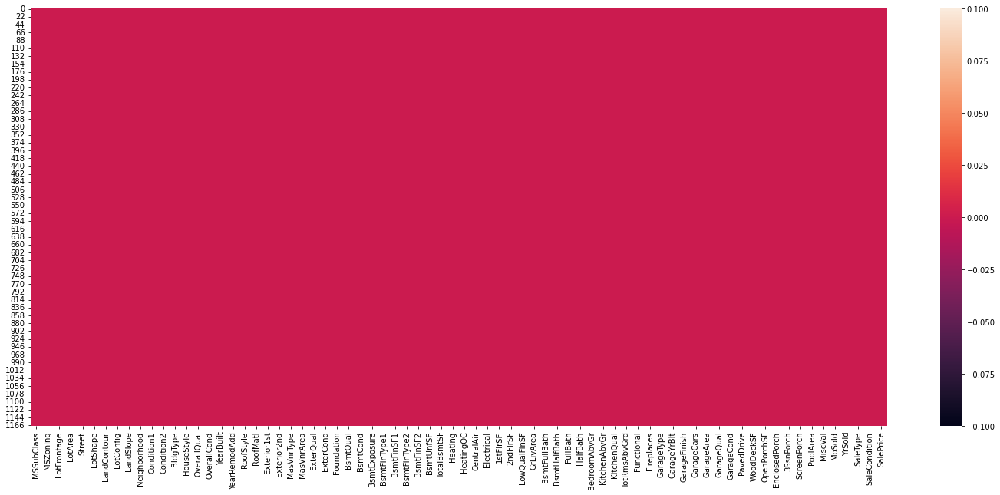

In [18]:
# Let's visualize the null values clearly through Heatmap
plt.figure(figsize=(25,10))
sns.heatmap(df_train.isnull())

In [19]:
# Statistical summary of dataset
df_train.describe()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000
mean,56.767979,70.988470,10484.749144,6.104452,5.595890,1970.930651,1984.758562,102.310078,444.726027,46.647260,569.721747,1061.095034,1169.860445,348.826199,6.380137,1525.066781,0.425514,0.055651,1.562500,0.388699,2.884418,1.045377,6.542808,0.617295,1978.193841,1.776541,476.860445,96.206336,46.559932,23.015411,3.639555,15.051370,3.448630,47.315068,6.344178,2007.804795,181477.005993
std,41.940650,22.437056,8957.442311,1.390153,1.124343,30.145255,20.785185,182.047152,462.664785,163.520016,449.375525,442.272249,391.161983,439.696370,50.892844,528.042957,0.521615,0.236699,0.551882,0.504929,0.817229,0.216292,1.598484,0.650575,24.198559,0.745554,214.466769,126.158988,66.381023,63.191089,29.088867,55.080816,44.896939,543.264432,2.686352,1.329738,79105.586863
min,20.000000,21.000000,1300.000000,1.000000,1.000000,1875.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1900.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,20.000000,60.000000,7621.500000,5.000000,5.000000,1954.000000,1966.000000,0.000000,0.000000,0.000000,216.000000,799.000000,892.000000,0.000000,0.000000,1143.250000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1962.000000,1.000000,338.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,130375.000000
50%,50.000000,70.988470,9522.500000,6.000000,5.000000,1972.000000,1993.000000,0.000000,385.500000,0.000000,474.000000,1005.500000,1096.500000,0.000000,0.000000,1468.500000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1978.193841,2.000000,480.000000,0.000000,24.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163995.000000
75%,70.000000,79.250000,11515.500000,7.000000,6.000000,2000.000000,2004.000000,160.000000,714.500000,0.000000,816.000000,1291.500000,1392.000000,729.000000,0.000000,1795.000000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2001.000000,2.000000,576.000000,171.000000,70.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,215000.000000
max,190.000000,313.000000,164660.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,2010.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


From the above description we can observe the following things

The counts of every column is same which means there are no missing values preent in the dataset.
In some of the columns the mean value is greater than the median(50%), which means they are skewed to right.
The median(50%) is bit greater than mean in some of the columns so they are skewed to left.
From the description we can say that the mean sales price of the house is around 181477 dollars(say), maximum sale price is 755000 and min is 163995.
By summarizing the data I can notice there is huge difference between maximum value and 75% percentile that leads to large number of outliers present in the dataset.
I will remove these outliers using either Zscore or IQR method.

## Data Visualization

#### Univariate Analysis

###### Plotting categorical columns

Pie plot for the column: MSZoning
RL         928
RM         163
FV          52
RH          16
C (all)      9
Name: MSZoning, dtype: int64


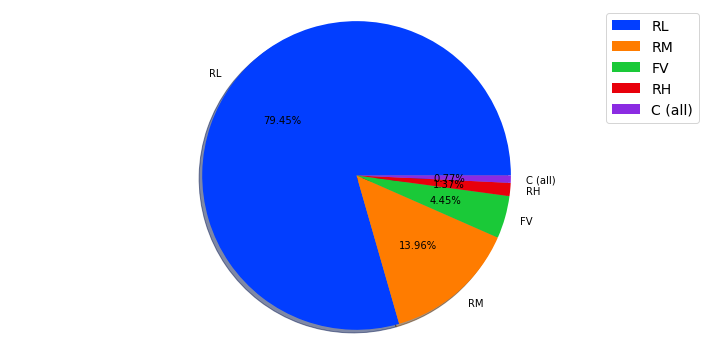

*****************************************************************************************************************************
Pie plot for the column: Street
Pave    1164
Grvl       4
Name: Street, dtype: int64


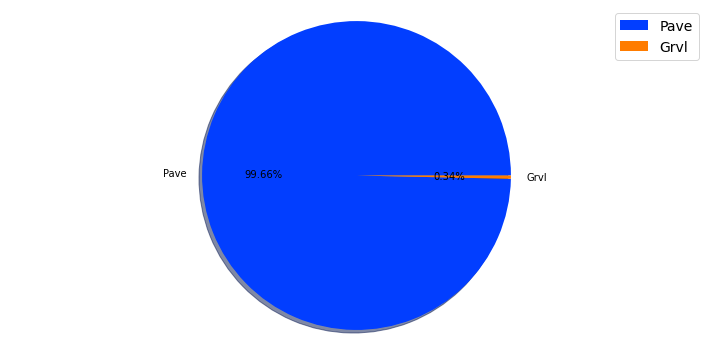

*****************************************************************************************************************************
Pie plot for the column: LotShape
Reg    740
IR1    390
IR2     32
IR3      6
Name: LotShape, dtype: int64


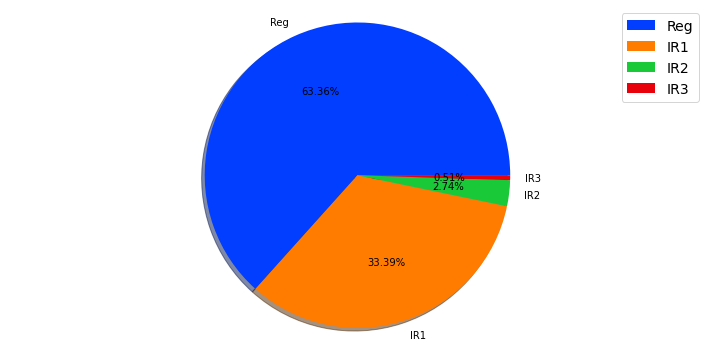

*****************************************************************************************************************************
Pie plot for the column: LandContour
Lvl    1046
Bnk      50
HLS      42
Low      30
Name: LandContour, dtype: int64


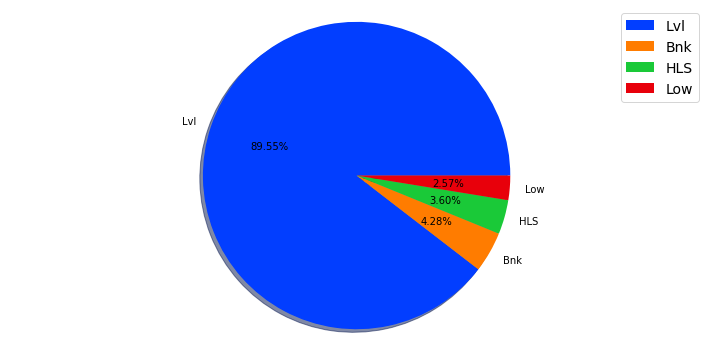

*****************************************************************************************************************************
Pie plot for the column: LotConfig
Inside     842
Corner     222
CulDSac     69
FR2         33
FR3          2
Name: LotConfig, dtype: int64


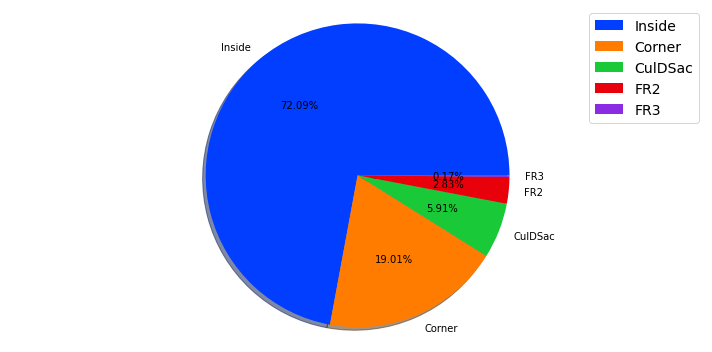

*****************************************************************************************************************************
Pie plot for the column: LandSlope
Gtl    1105
Mod      51
Sev      12
Name: LandSlope, dtype: int64


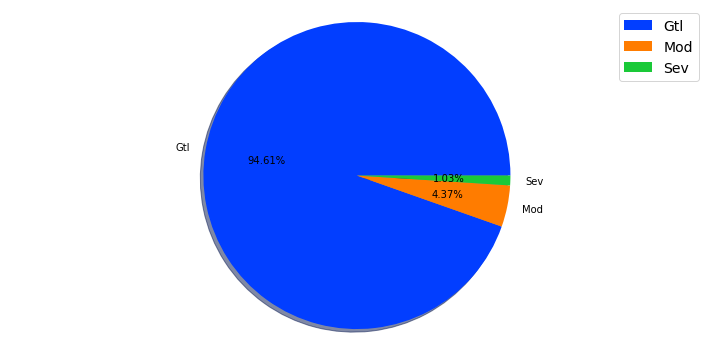

*****************************************************************************************************************************
Pie plot for the column: Neighborhood
NAmes      182
CollgCr    118
OldTown     86
Edwards     83
Somerst     68
Gilbert     64
NridgHt     61
Sawyer      60
NWAmes      59
SawyerW     51
BrkSide     50
Crawfor     45
NoRidge     35
Mitchel     34
IDOTRR      30
Timber      24
ClearCr     24
SWISU       21
StoneBr     19
Blmngtn     15
BrDale      11
MeadowV      9
Veenker      9
NPkVill      8
Blueste      2
Name: Neighborhood, dtype: int64


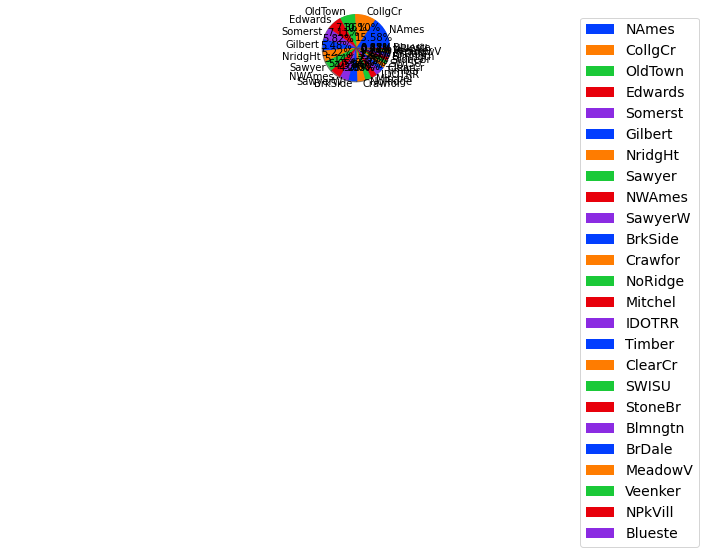

*****************************************************************************************************************************
Pie plot for the column: Condition1
Norm      1005
Feedr       67
Artery      38
RRAn        20
PosN        17
RRAe         9
PosA         6
RRNn         4
RRNe         2
Name: Condition1, dtype: int64


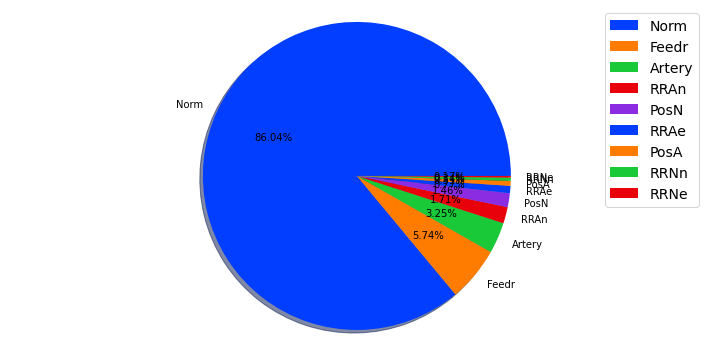

*****************************************************************************************************************************
Pie plot for the column: Condition2
Norm      1154
Feedr        6
PosN         2
Artery       2
RRAe         1
RRNn         1
PosA         1
RRAn         1
Name: Condition2, dtype: int64


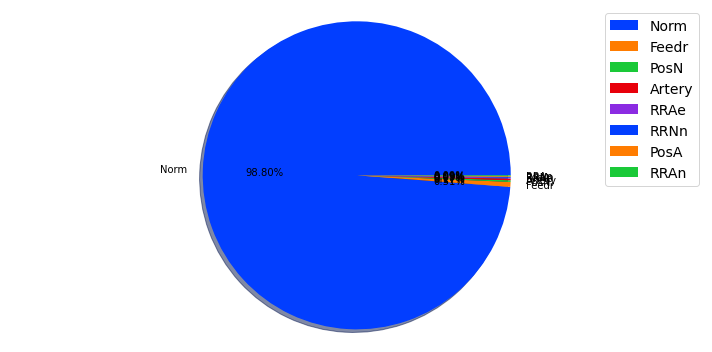

*****************************************************************************************************************************
Pie plot for the column: BldgType
1Fam      981
TwnhsE     90
Duplex     41
Twnhs      29
2fmCon     27
Name: BldgType, dtype: int64


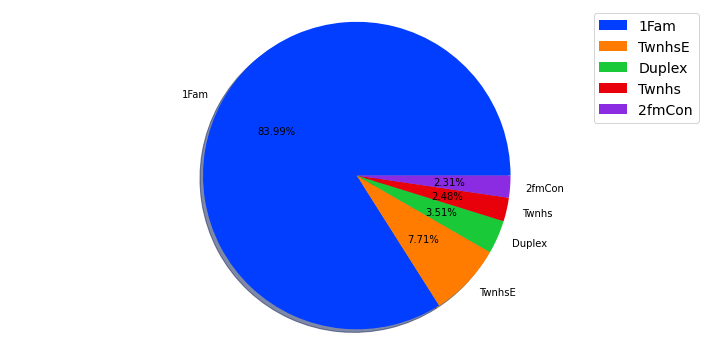

*****************************************************************************************************************************
Pie plot for the column: HouseStyle
1Story    578
2Story    361
1.5Fin    121
SLvl       47
SFoyer     32
1.5Unf     12
2.5Unf     10
2.5Fin      7
Name: HouseStyle, dtype: int64


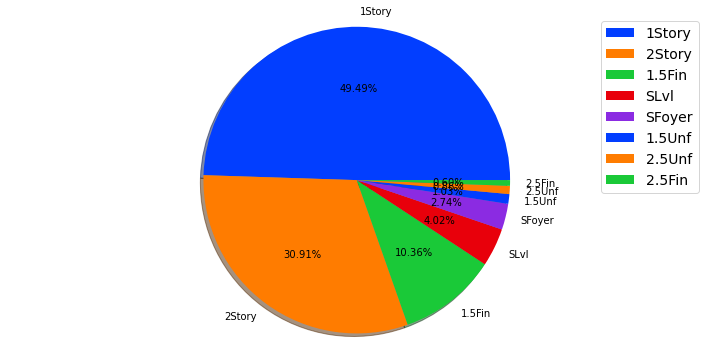

*****************************************************************************************************************************
Pie plot for the column: RoofStyle
Gable      915
Hip        225
Flat        12
Gambrel      9
Mansard      5
Shed         2
Name: RoofStyle, dtype: int64


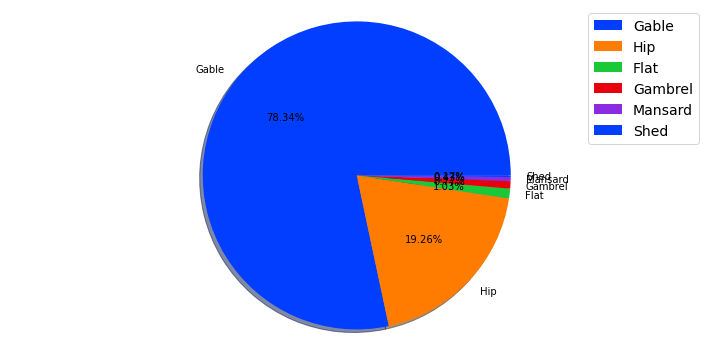

*****************************************************************************************************************************
Pie plot for the column: RoofMatl
CompShg    1144
Tar&Grv      10
WdShngl       6
WdShake       4
Roll          1
ClyTile       1
Metal         1
Membran       1
Name: RoofMatl, dtype: int64


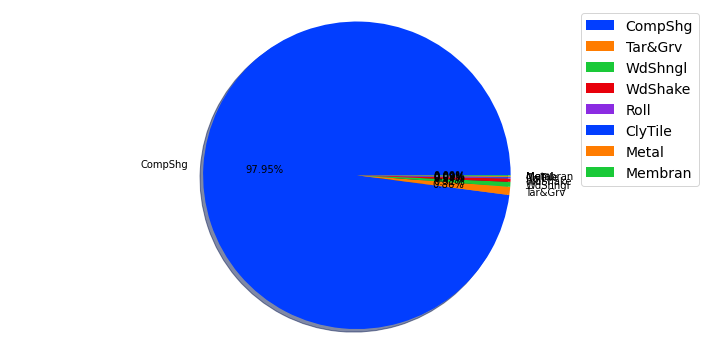

*****************************************************************************************************************************
Pie plot for the column: Exterior1st
VinylSd    396
HdBoard    179
MetalSd    178
Wd Sdng    174
Plywood     93
CemntBd     42
BrkFace     41
Stucco      22
WdShing     19
AsbShng     19
Stone        2
AsphShn      1
ImStucc      1
BrkComm      1
Name: Exterior1st, dtype: int64


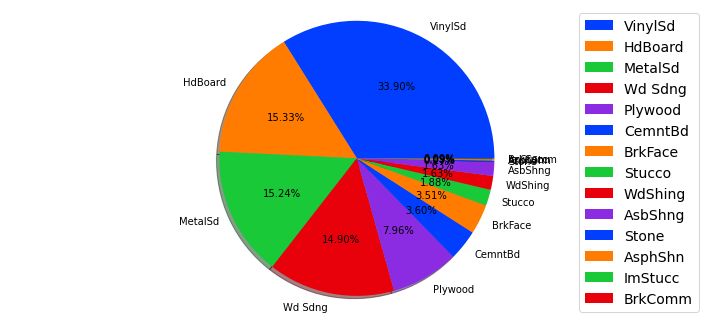

*****************************************************************************************************************************
Pie plot for the column: Exterior2nd
VinylSd    387
MetalSd    173
HdBoard    170
Wd Sdng    165
Plywood    118
CmentBd     42
Wd Shng     31
Stucco      23
BrkFace     20
AsbShng     18
ImStucc      8
Brk Cmn      5
Stone        4
AsphShn      3
Other        1
Name: Exterior2nd, dtype: int64


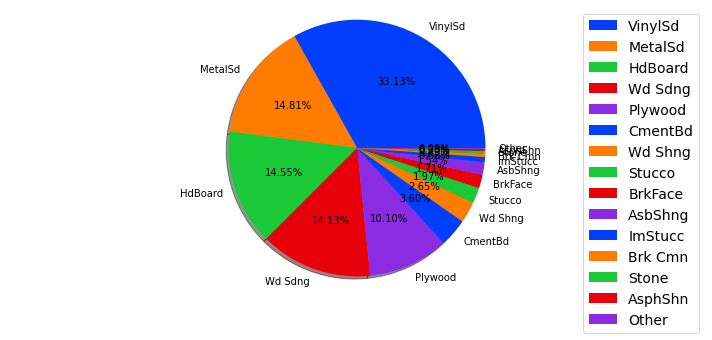

*****************************************************************************************************************************
Pie plot for the column: MasVnrType
None       703
BrkFace    354
Stone       98
BrkCmn      13
Name: MasVnrType, dtype: int64


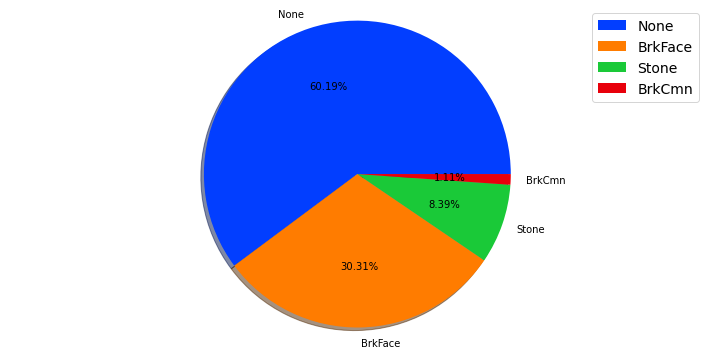

*****************************************************************************************************************************
Pie plot for the column: ExterQual
TA    717
Gd    397
Ex     43
Fa     11
Name: ExterQual, dtype: int64


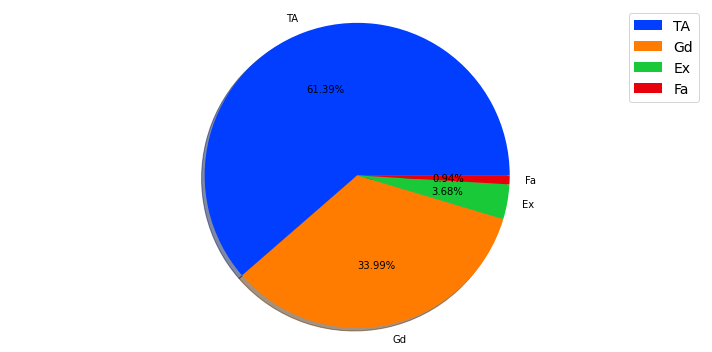

*****************************************************************************************************************************
Pie plot for the column: ExterCond
TA    1022
Gd     117
Fa      26
Ex       2
Po       1
Name: ExterCond, dtype: int64


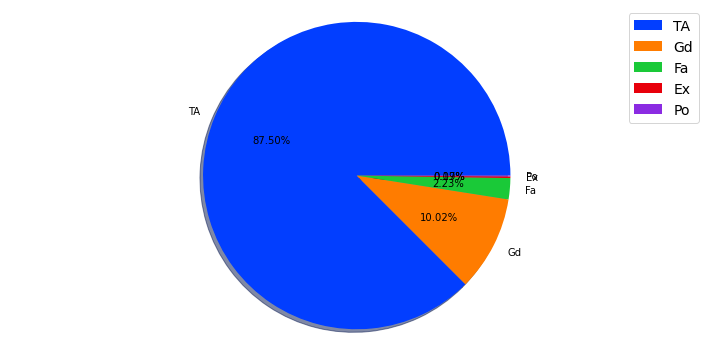

*****************************************************************************************************************************
Pie plot for the column: Foundation
CBlock    516
PConc     513
BrkTil    112
Slab       21
Stone       5
Wood        1
Name: Foundation, dtype: int64


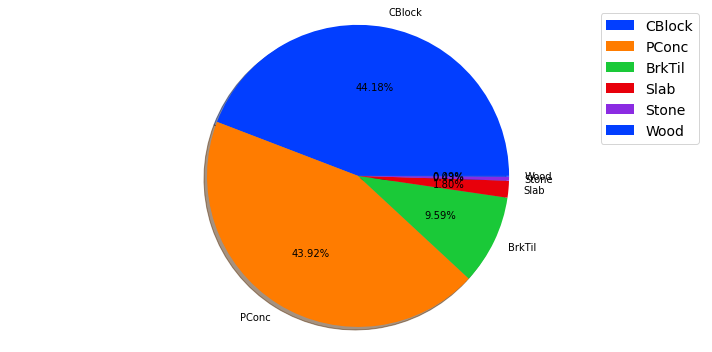

*****************************************************************************************************************************
Pie plot for the column: BsmtQual
TA    547
Gd    498
Ex     94
Fa     29
Name: BsmtQual, dtype: int64


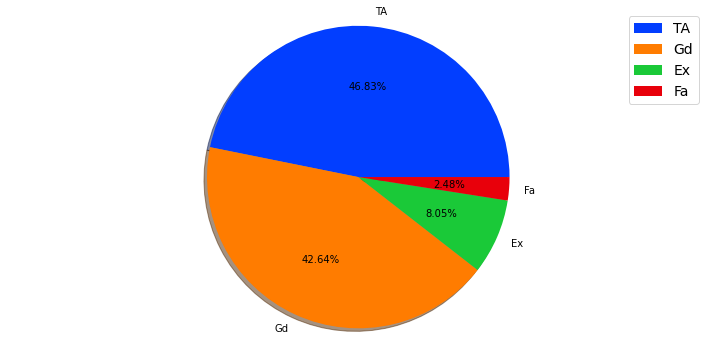

*****************************************************************************************************************************
Pie plot for the column: BsmtCond
TA    1071
Gd      56
Fa      39
Po       2
Name: BsmtCond, dtype: int64


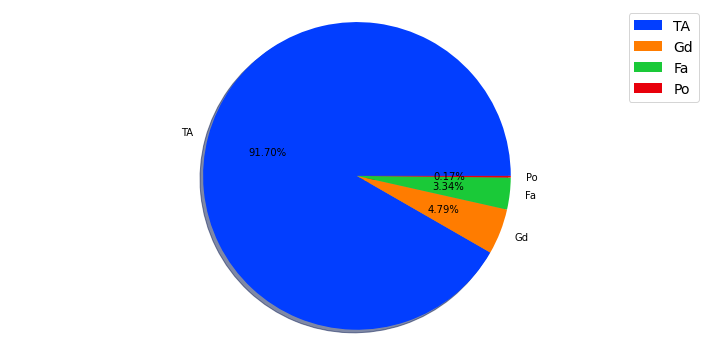

*****************************************************************************************************************************
Pie plot for the column: BsmtExposure
No    787
Av    180
Gd    108
Mn     93
Name: BsmtExposure, dtype: int64


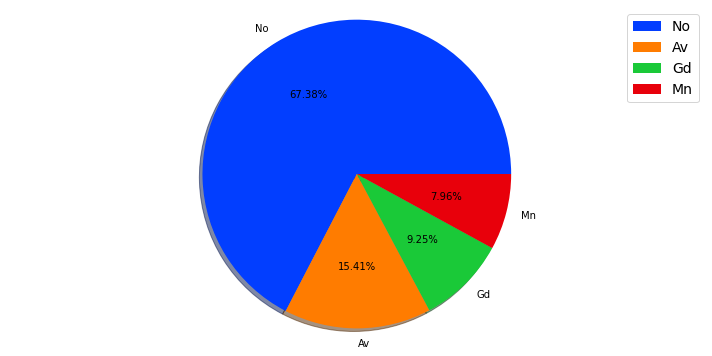

*****************************************************************************************************************************
Pie plot for the column: BsmtFinType1
Unf    375
GLQ    330
ALQ    174
BLQ    121
Rec    109
LwQ     59
Name: BsmtFinType1, dtype: int64


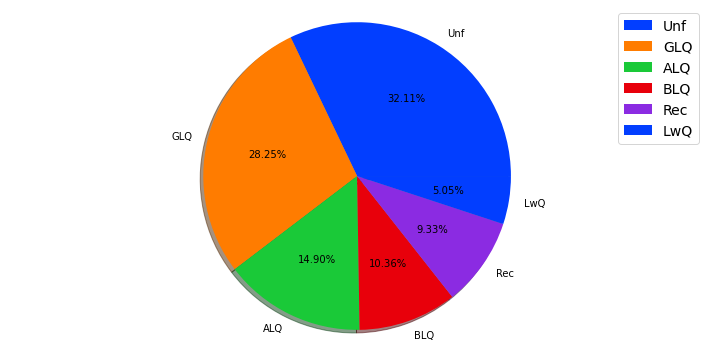

*****************************************************************************************************************************
Pie plot for the column: BsmtFinType2
Unf    1033
Rec      43
LwQ      40
BLQ      24
ALQ      16
GLQ      12
Name: BsmtFinType2, dtype: int64


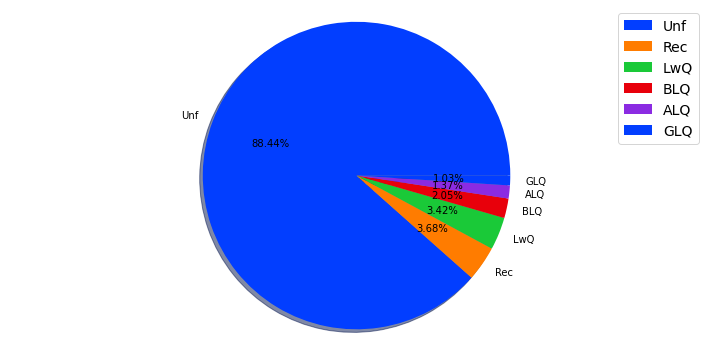

*****************************************************************************************************************************
Pie plot for the column: Heating
GasA     1143
GasW       14
Grav        5
Wall        4
Floor       1
OthW        1
Name: Heating, dtype: int64


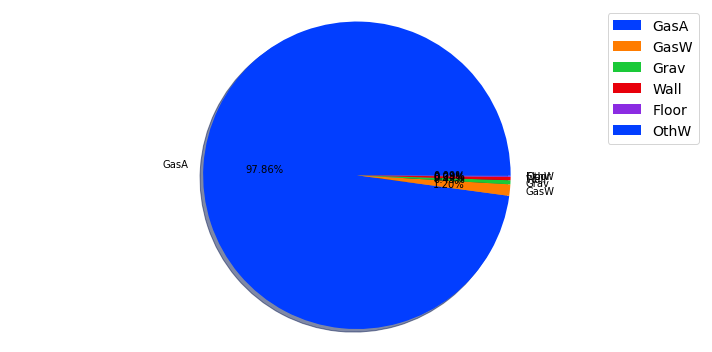

*****************************************************************************************************************************
Pie plot for the column: HeatingQC
Ex    585
TA    352
Gd    192
Fa     38
Po      1
Name: HeatingQC, dtype: int64


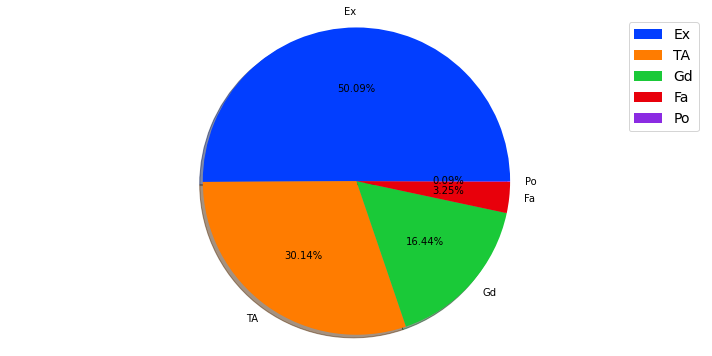

*****************************************************************************************************************************
Pie plot for the column: CentralAir
Y    1090
N      78
Name: CentralAir, dtype: int64


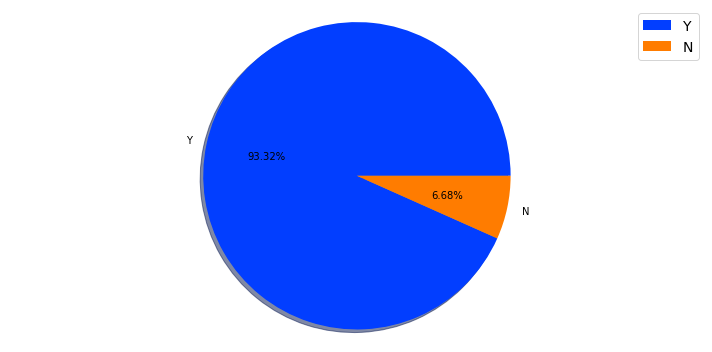

*****************************************************************************************************************************
Pie plot for the column: Electrical
SBrkr    1070
FuseA      74
FuseF      21
FuseP       2
Mix         1
Name: Electrical, dtype: int64


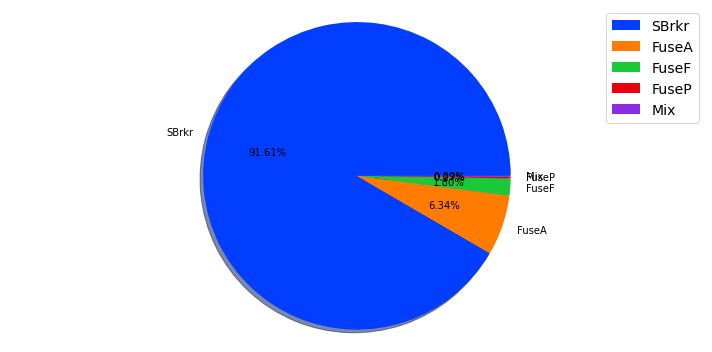

*****************************************************************************************************************************
Pie plot for the column: KitchenQual
TA    578
Gd    478
Ex     82
Fa     30
Name: KitchenQual, dtype: int64


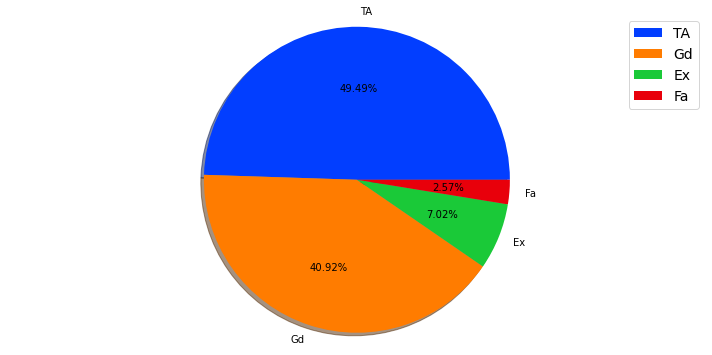

*****************************************************************************************************************************
Pie plot for the column: Functional
Typ     1085
Min2      30
Min1      25
Mod       12
Maj1      11
Maj2       4
Sev        1
Name: Functional, dtype: int64


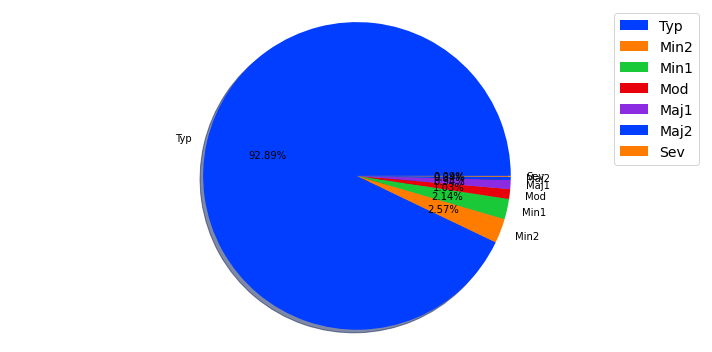

*****************************************************************************************************************************
Pie plot for the column: GarageType
Attchd     755
Detchd     314
BuiltIn     70
Basment     16
CarPort      8
2Types       5
Name: GarageType, dtype: int64


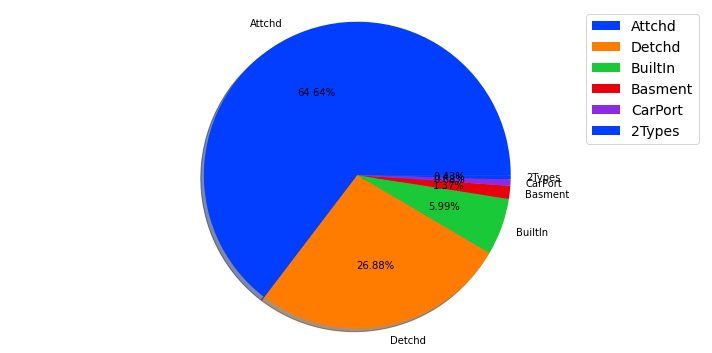

*****************************************************************************************************************************
Pie plot for the column: GarageFinish
Unf    551
RFn    339
Fin    278
Name: GarageFinish, dtype: int64


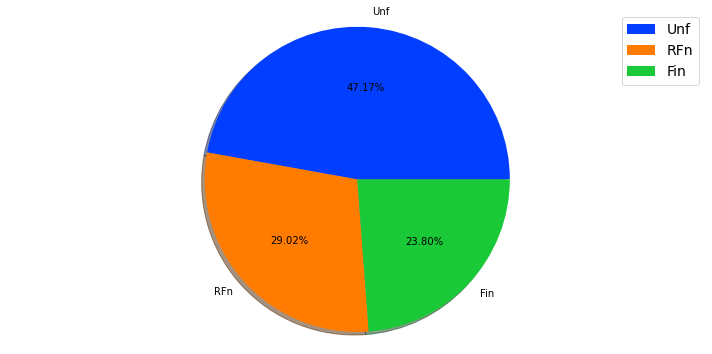

*****************************************************************************************************************************
Pie plot for the column: GarageQual
TA    1114
Fa      39
Gd      11
Ex       2
Po       2
Name: GarageQual, dtype: int64


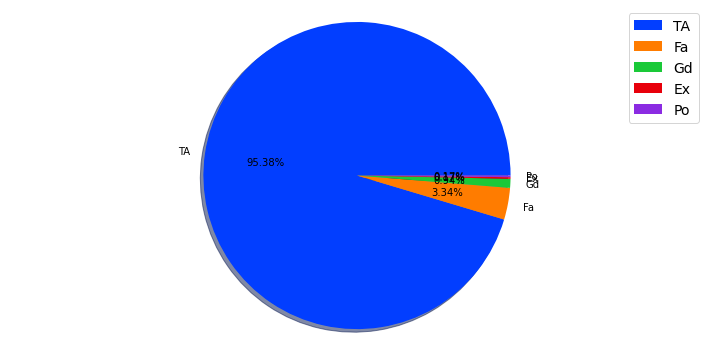

*****************************************************************************************************************************
Pie plot for the column: GarageCond
TA    1125
Fa      28
Gd       8
Po       6
Ex       1
Name: GarageCond, dtype: int64


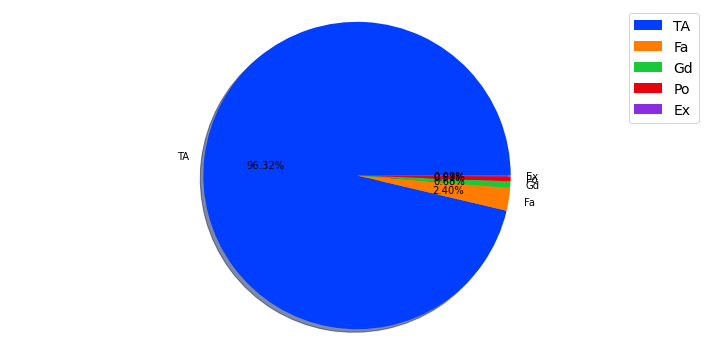

*****************************************************************************************************************************
Pie plot for the column: PavedDrive
Y    1071
N      74
P      23
Name: PavedDrive, dtype: int64


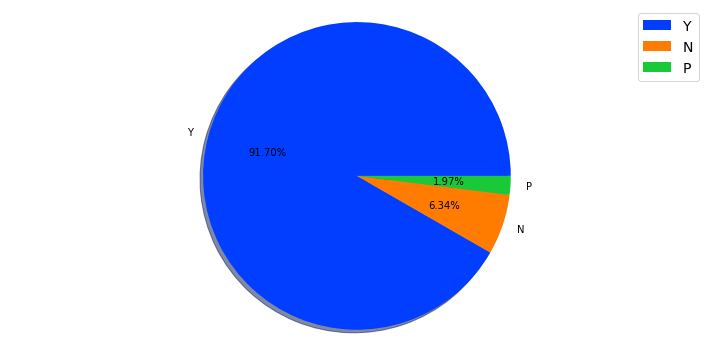

*****************************************************************************************************************************
Pie plot for the column: SaleType
WD       999
New      106
COD       38
ConLD      8
ConLI      5
ConLw      4
Oth        3
CWD        3
Con        2
Name: SaleType, dtype: int64


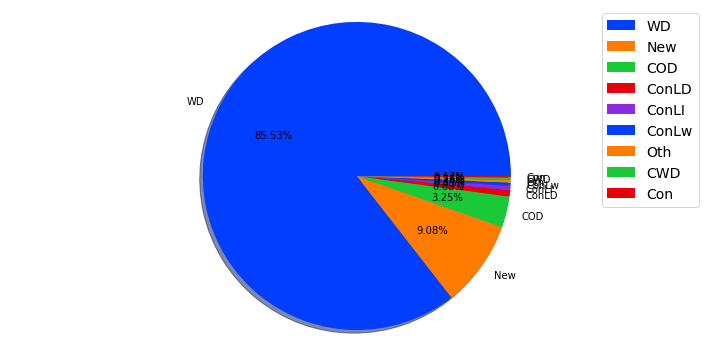

*****************************************************************************************************************************
Pie plot for the column: SaleCondition
Normal     945
Partial    108
Abnorml     81
Family      18
Alloca      12
AdjLand      4
Name: SaleCondition, dtype: int64


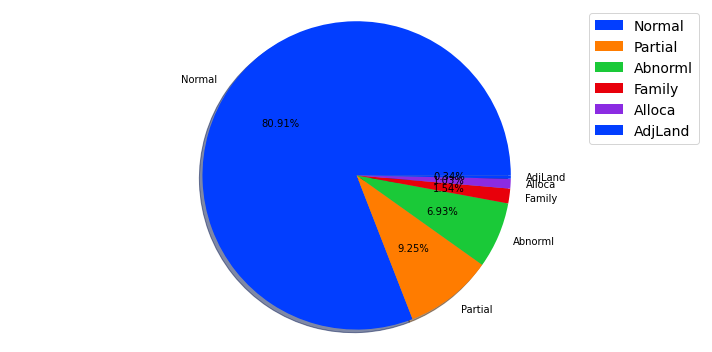

*****************************************************************************************************************************


In [20]:
def generate_pie(i):
    plt.figure(figsize=(10,5))
    colors = sns.color_palette('bright')[0:5]
    plt.pie(i.value_counts(), labels=i.value_counts().index, colors = colors, autopct='%1.2f%%',shadow=True,)
    plt.legend(prop={'size':14})
    plt.axis('equal')
    plt.tight_layout()
    return plt.show()


for j in df_train[Catg_data]:
    print(f"Pie plot for the column:", j)
    print(df_train[j].value_counts())
    generate_pie(df_train[j])
    print("*"*125)

Observations:

1.	Street: The count of road access to the property Paved is 1164 which covers around 99.66% of the property where Graved type has count 4 that is only 0.34%.
2.	LotShape: The count is high for the property having the shape regular followed by slightly regular and the count is less for irregular shape of property.
3.	LandContour: The total number of flatness of the property for level is high which has 89.55% and the others like banked, hillside and depression have very less flatness of area.
4.	LandSlope: The slope of the property Gentle slope has very high count of 1105 i.e, 94.61% and other types of Moderate Slope and Severe Slope have very less count.
5.	MasVnrType: Around 60% of the houses does not have Masonry veneer type, 30% of the houses contains Brick Face type of Masonry veneer.
6.	ExterQual: Around 61% of the houses evaluates typical/average quality of the material on the exterior, 34% of the houses have good quality of the material on the exterior. Only few have excellent quality.
7.	BsmtQual: Most of the houses evaluates typical/average and good quality of height of the basement, only few of the houses have excellent quality.
8.	BsmtCond: Around 91% of the houses have typical/average condition of the basement and only 2 houses have poor condition.
A.	BsmtExposure: Around 67% of the houses does not contain any walkout or garden level walls and 7% of the houses have minimum exposure.
9.	CentralAir: 93.32% of the houses have central air conditioning and only 6.68% of houses do not have air conditioning.
10.	KitchenQual: 49% of the houses contains typical/average kitchen quality and 40% of the houses have good kitchen quality. The count for excellent kitchen quality is very low and is around 2%.
11.	GarageFinish: 47% Of the houses have unfinished garage interior, 29% rough finished and only 23% of the houses' interior garage has finished.
12.	PavedDrive: 91.70% of the houses contains the paved driveway.


Count plot on Numerical columns

RL         928
RM         163
FV          52
RH          16
C (all)      9
Name: MSZoning, dtype: int64


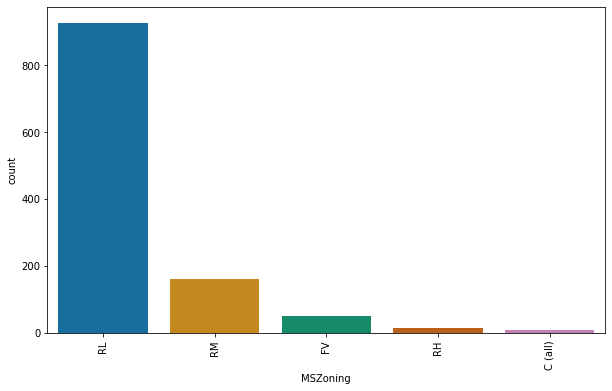

*****************************************************************************************************************************
Inside     842
Corner     222
CulDSac     69
FR2         33
FR3          2
Name: LotConfig, dtype: int64


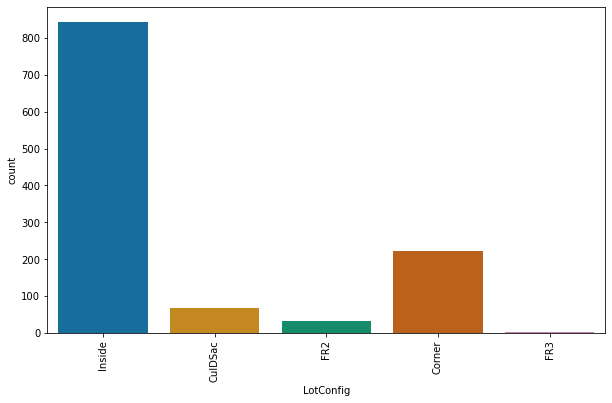

*****************************************************************************************************************************
NAmes      182
CollgCr    118
OldTown     86
Edwards     83
Somerst     68
Gilbert     64
NridgHt     61
Sawyer      60
NWAmes      59
SawyerW     51
BrkSide     50
Crawfor     45
NoRidge     35
Mitchel     34
IDOTRR      30
Timber      24
ClearCr     24
SWISU       21
StoneBr     19
Blmngtn     15
BrDale      11
MeadowV      9
Veenker      9
NPkVill      8
Blueste      2
Name: Neighborhood, dtype: int64


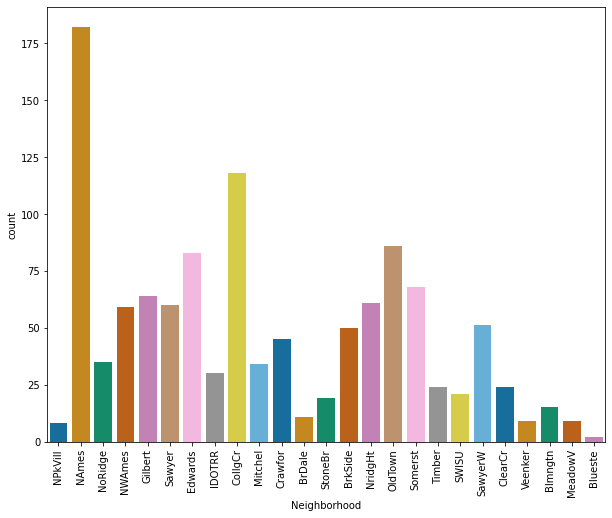

*****************************************************************************************************************************
Norm      1005
Feedr       67
Artery      38
RRAn        20
PosN        17
RRAe         9
PosA         6
RRNn         4
RRNe         2
Name: Condition1, dtype: int64


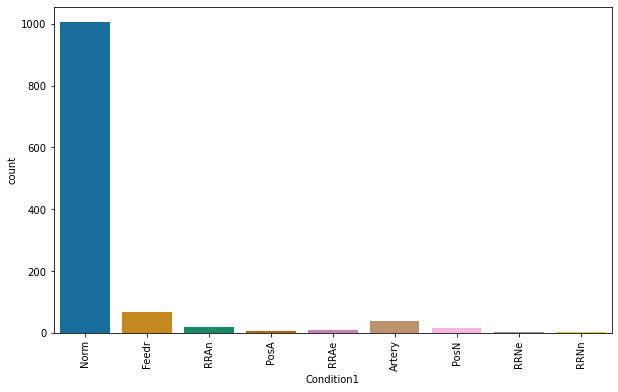

*****************************************************************************************************************************
Norm      1154
Feedr        6
PosN         2
Artery       2
RRAe         1
RRNn         1
PosA         1
RRAn         1
Name: Condition2, dtype: int64


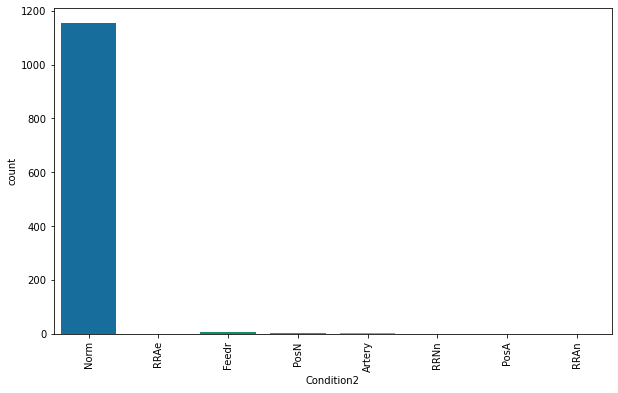

*****************************************************************************************************************************
1Fam      981
TwnhsE     90
Duplex     41
Twnhs      29
2fmCon     27
Name: BldgType, dtype: int64


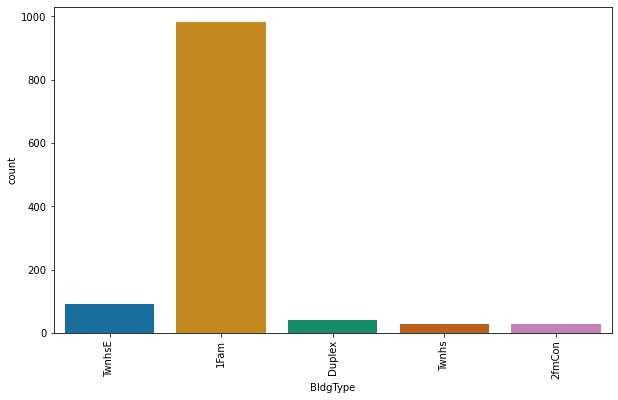

*****************************************************************************************************************************
1Story    578
2Story    361
1.5Fin    121
SLvl       47
SFoyer     32
1.5Unf     12
2.5Unf     10
2.5Fin      7
Name: HouseStyle, dtype: int64


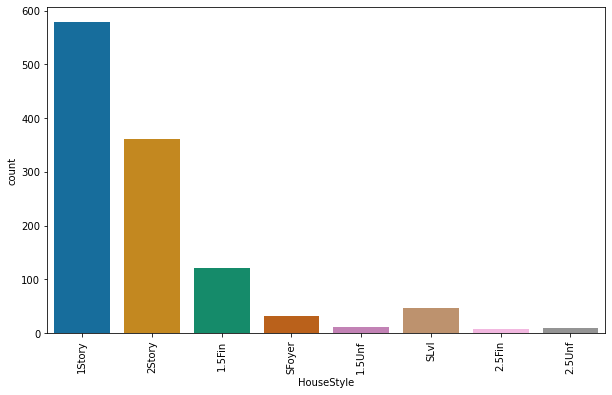

*****************************************************************************************************************************
Gable      915
Hip        225
Flat        12
Gambrel      9
Mansard      5
Shed         2
Name: RoofStyle, dtype: int64


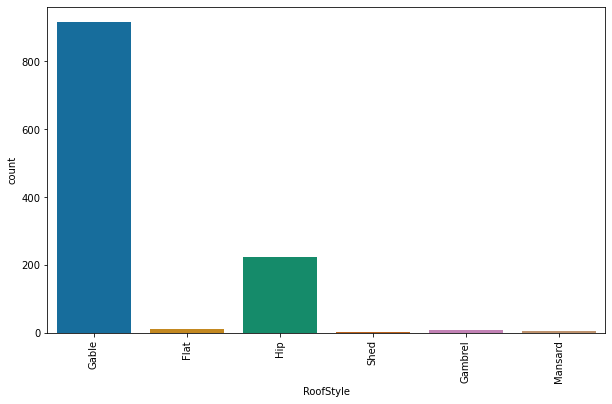

*****************************************************************************************************************************
CompShg    1144
Tar&Grv      10
WdShngl       6
WdShake       4
Roll          1
ClyTile       1
Metal         1
Membran       1
Name: RoofMatl, dtype: int64


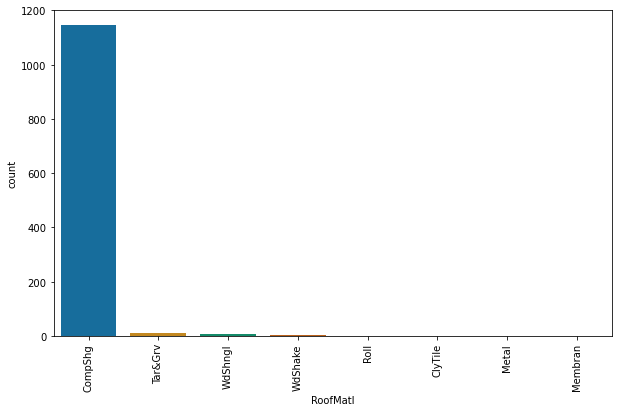

*****************************************************************************************************************************
VinylSd    396
HdBoard    179
MetalSd    178
Wd Sdng    174
Plywood     93
CemntBd     42
BrkFace     41
Stucco      22
WdShing     19
AsbShng     19
Stone        2
AsphShn      1
ImStucc      1
BrkComm      1
Name: Exterior1st, dtype: int64


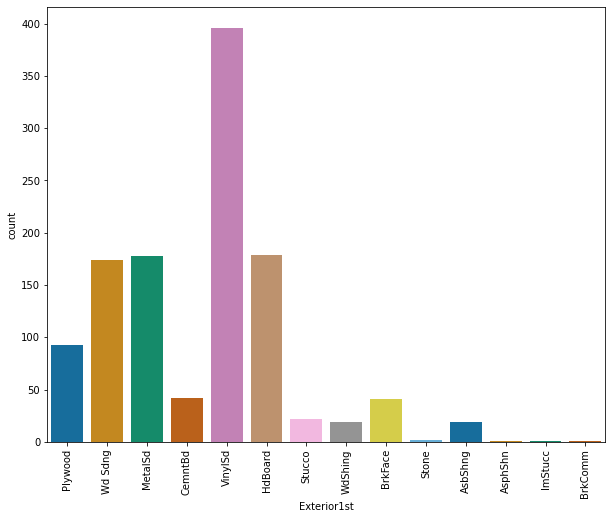

*****************************************************************************************************************************
VinylSd    387
MetalSd    173
HdBoard    170
Wd Sdng    165
Plywood    118
CmentBd     42
Wd Shng     31
Stucco      23
BrkFace     20
AsbShng     18
ImStucc      8
Brk Cmn      5
Stone        4
AsphShn      3
Other        1
Name: Exterior2nd, dtype: int64


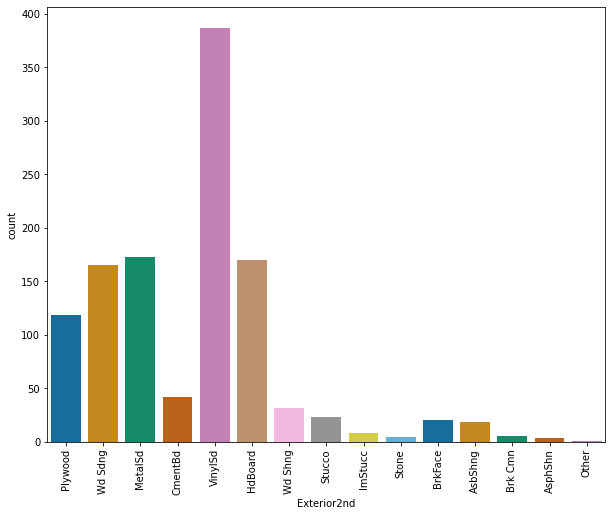

*****************************************************************************************************************************
TA    1022
Gd     117
Fa      26
Ex       2
Po       1
Name: ExterCond, dtype: int64


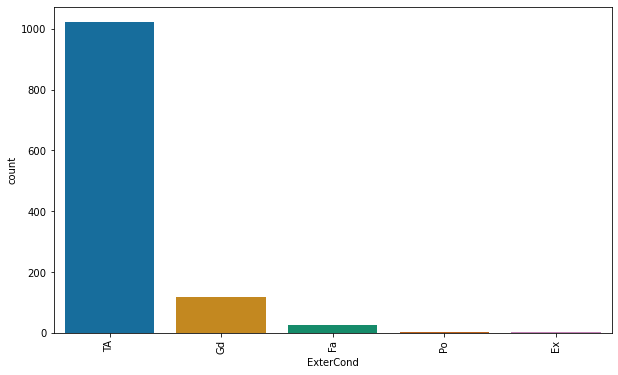

*****************************************************************************************************************************
CBlock    516
PConc     513
BrkTil    112
Slab       21
Stone       5
Wood        1
Name: Foundation, dtype: int64


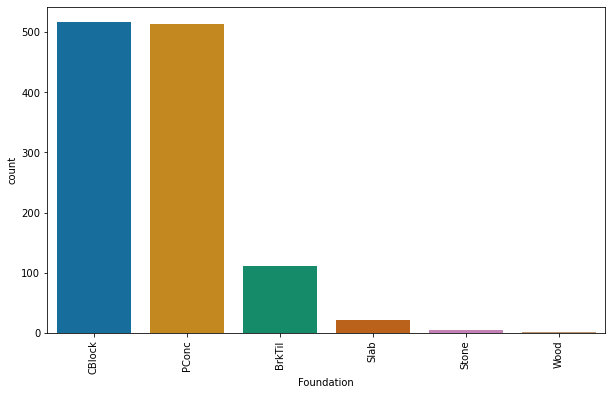

*****************************************************************************************************************************
Unf    375
GLQ    330
ALQ    174
BLQ    121
Rec    109
LwQ     59
Name: BsmtFinType1, dtype: int64


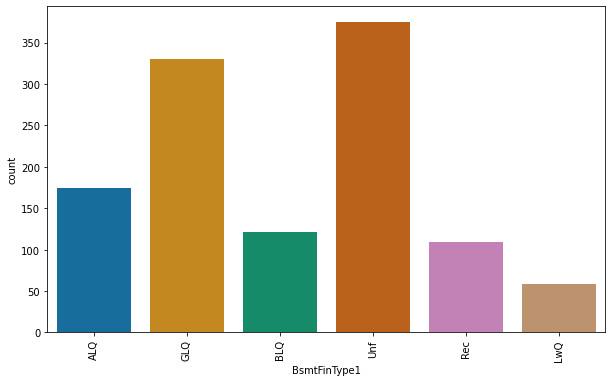

*****************************************************************************************************************************
Unf    1033
Rec      43
LwQ      40
BLQ      24
ALQ      16
GLQ      12
Name: BsmtFinType2, dtype: int64


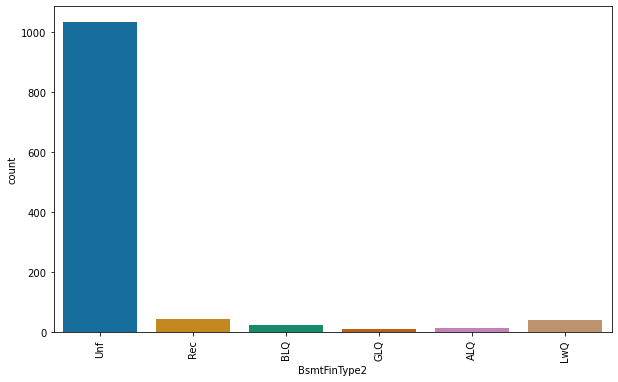

*****************************************************************************************************************************
GasA     1143
GasW       14
Grav        5
Wall        4
Floor       1
OthW        1
Name: Heating, dtype: int64


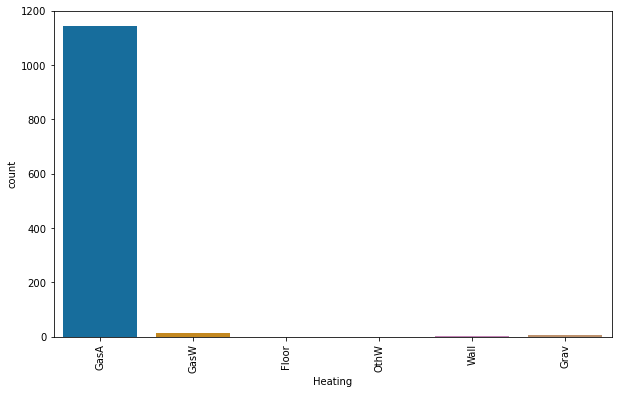

*****************************************************************************************************************************
Ex    585
TA    352
Gd    192
Fa     38
Po      1
Name: HeatingQC, dtype: int64


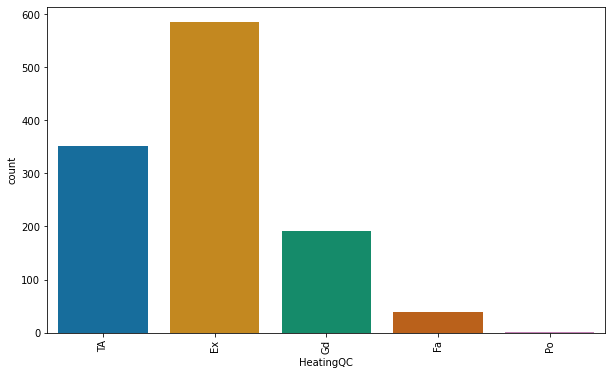

*****************************************************************************************************************************
SBrkr    1070
FuseA      74
FuseF      21
FuseP       2
Mix         1
Name: Electrical, dtype: int64


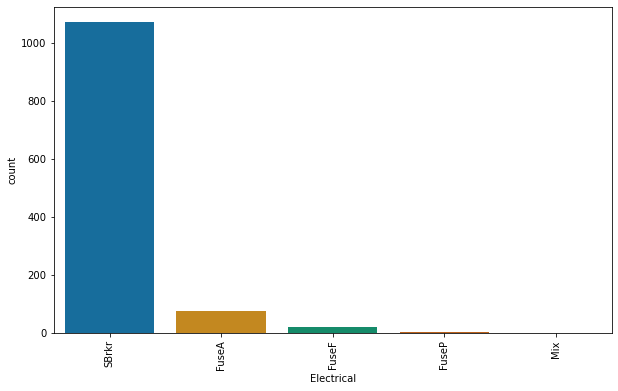

*****************************************************************************************************************************
Typ     1085
Min2      30
Min1      25
Mod       12
Maj1      11
Maj2       4
Sev        1
Name: Functional, dtype: int64


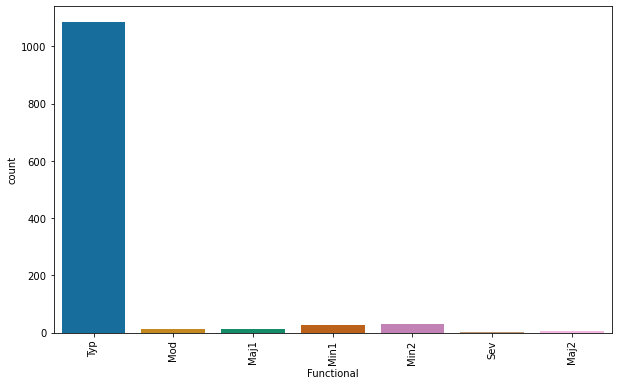

*****************************************************************************************************************************
0    551
1    518
2     94
3      5
Name: Fireplaces, dtype: int64


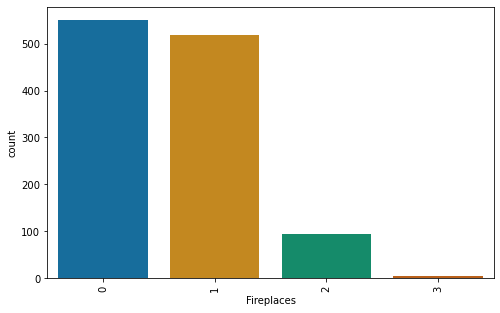

*****************************************************************************************************************************
Attchd     755
Detchd     314
BuiltIn     70
Basment     16
CarPort      8
2Types       5
Name: GarageType, dtype: int64


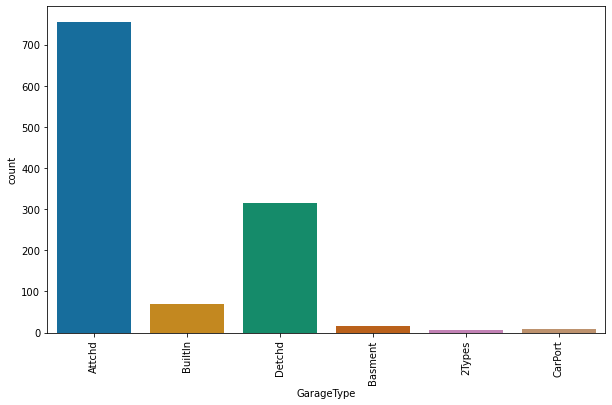

*****************************************************************************************************************************
TA    1114
Fa      39
Gd      11
Ex       2
Po       2
Name: GarageQual, dtype: int64


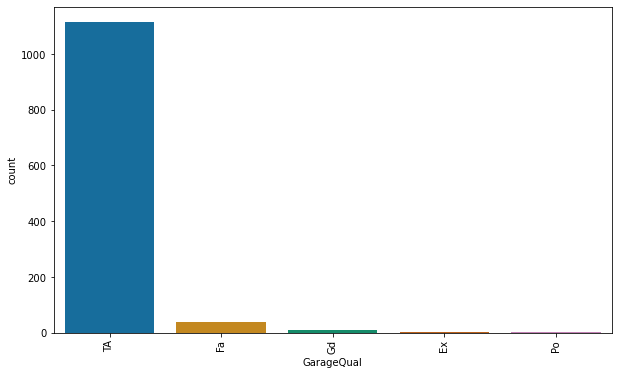

*****************************************************************************************************************************
TA    1125
Fa      28
Gd       8
Po       6
Ex       1
Name: GarageCond, dtype: int64


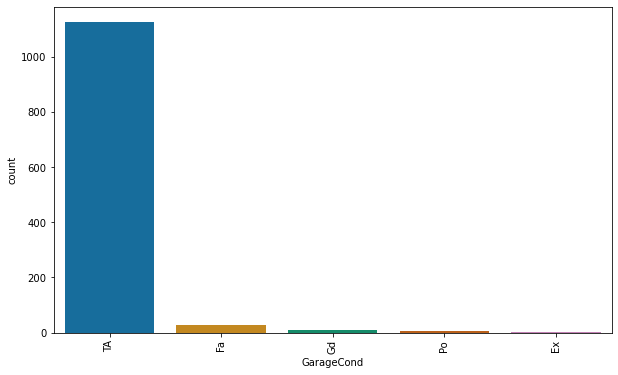

*****************************************************************************************************************************
WD       999
New      106
COD       38
ConLD      8
ConLI      5
ConLw      4
Oth        3
CWD        3
Con        2
Name: SaleType, dtype: int64


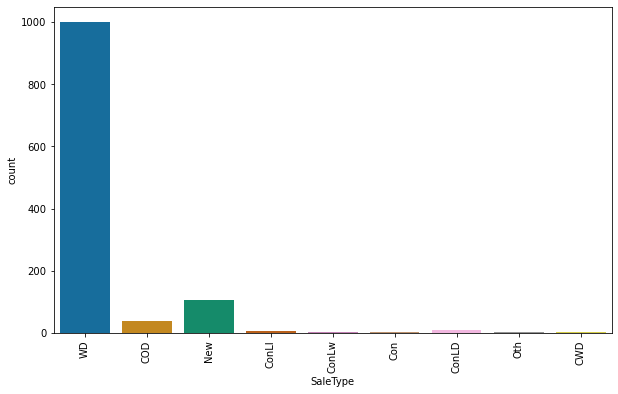

*****************************************************************************************************************************
Normal     945
Partial    108
Abnorml     81
Family      18
Alloca      12
AdjLand      4
Name: SaleCondition, dtype: int64


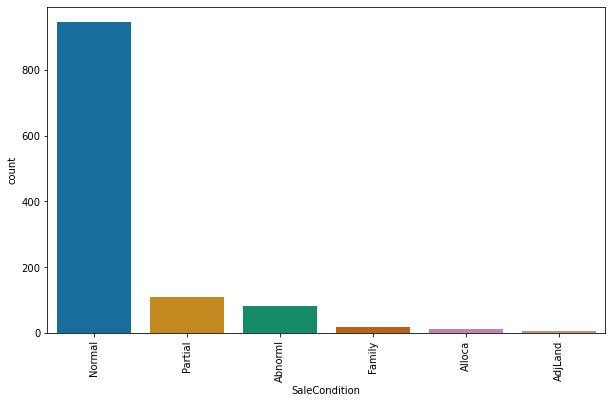

*****************************************************************************************************************************


In [27]:
def value_count(column):
    counts=len(df_train[column].value_counts())
    if counts<3:
        plt.figure(figsize=(8,5))
    elif counts<5:
        plt.figure(figsize=(8,5))
        plt.xticks(rotation=90)
    elif counts<10:
        plt.figure(figsize=(10,6))
        plt.xticks(rotation=90)
    else:
        plt.figure(figsize=(10,8))
        plt.xticks(rotation=90)
    sns.countplot(x=column,data=df_train,palette="colorblind")
    plt.show()
    print("*"*125)
    
num = df_train[['MSZoning','LotConfig',  'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd',  'ExterCond', 'Foundation','BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC',  'Electrical',  'Functional', 'Fireplaces', 'GarageType',  'GarageQual', 'GarageCond', 'SaleType', 'SaleCondition']]
for i in num:
    print(num[i].value_counts())
    value_count(i)

Observations:

•	MSZoning: The houses having Residential Low-Density zoning of the sale have high count and commercial zoning sale have very less count compared to others.
•	LotConfig: Inside lot configuration has high count and Frontage on 3 sides of property have very less count compared to others.
•	Neighborhood: The count is high for the North Ames cities followed by college creek and count is very low for Bluestem.
•	Condition1: The count is high for the Normal proximity condition apart from this all the others have very less count.
•	Condition2: Like condition1, in comdition2 also Normal proximity has very high count compared to others.
•	BldgType: Single-family detached dwelling type has very high counts compared to other types have very less count.
•	HouseStyle: 1 story style of dwelling has high count followed by 2 story and others have very less count.
•	RoofStyle: The flat type roof has high count and shed has very less count.
•	RoofMatl: The roof material type Standard (Composite) Shingle has highest count and others have very less counts.
•	Exterior1st: Most of the houses have Vinyl Siding exterior covering materials followed by hard board also Brick Common, Asphalt Shingles and Imitation Stucco have very count which means there are no more houses with these types.
•	Exterior2nd: Like Exterior1st, here also most of the houses have Vinyl Siding exterior covering materials.
•	ExterCond: The present condition of the material on the exterior for most of the houses are Average/Typical.
•	Foundation: Most of the houses have Cinder Block and Poured Concrete type of foundation.
•	BsmtFinType1: The count is high for the houses having unfinished basement area. Also some houses have Good Living Quarters.
•	BsmtFinType2: Like BsmtFinType1, here also the count is high for unfinished basements.
•	Heating: Most of the houses have Gas forced warm air furnace heating type.
•	HeatingQC: Most of the houses have excellent heating quality and condition also some houses have typical/average HeatingQC and only 1% of the houses have poor heating quality and condition.
•	Electrical: The electrical system of the type Standard Circuit Breakers & Romex has very high count which means most of the houses have this facility.
•	Functional: The total number of home functionality of the property for typical functionality have high count compared to others.
•	Fireplaces: The houses with Masonry Fireplace in main level have good quality compared ot others.
•	GarageType: The garage location attached to home has high count also the garage locations detached to home have moderate level of counts. Only few houses have car port and more than one type of garage.
•	GarageQual: Houses with typical/average garage quality have high count compared to others.
•	GarageCond: Houses with typical/average garage condition have high count compared to others.
•	SaleType: Warranty Deed type of sale has high count followed by Home just constructed and sold(new).
•	SaleCondition: Normal sale has high count also the home which was not completed when last assessed also has average sale condition.


#### Bivariate Analysis

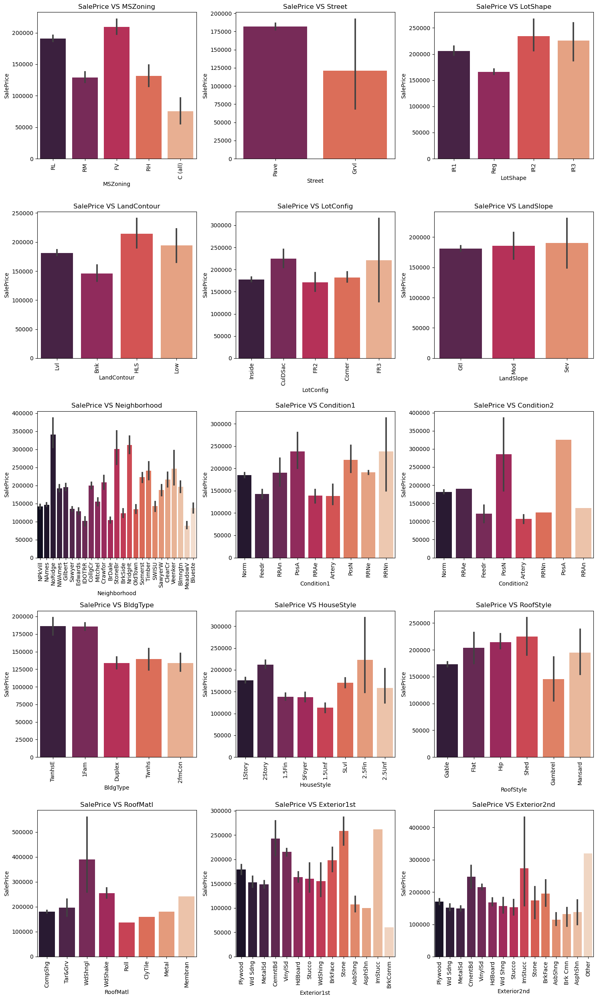

In [29]:
nom_data = ['MSZoning','Street','LotShape','LandContour','LotConfig','LandSlope','Neighborhood','Condition1','Condition2','BldgType','HouseStyle','RoofStyle','RoofMatl','Exterior1st','Exterior2nd']
plt.style.use('default')
plt.figure(figsize=(15,25))
for i in range(len(nom_data)):
    plt.subplot(5,3,i+1)
    sns.barplot(y=df_train['SalePrice'],x=df_train[nom_data[i]],palette="rocket")
    plt.title(f"SalePrice VS {nom_data[i]}",fontsize=12)
    plt.xticks(rotation = 90)  
    plt.tight_layout()

Observations:
    
•	Most of the houses are belongs to Floating Village Residential followed by Residential Low Density. The house from this zone has high saleprice compared to other zones.
•	By observing the bar plot, it is obvious that the property of house with Paved type of road have high SalePrice and the houses in gravel roads have very less sale price.
•	Most of the houses having moderately irregular and irregular shape of property have high sale price and houses with regular type of property have less sale price compared to others.
•	The houses having the hillside and depression property flatness have high sale price compared to others.
•	Most of the houses with Frontage on 3 sides of property have high sale price compared to others.
•	There is no significance difference between the slope of the property. As we can observe the houses having Gentle slope, Moderate Slope and Severe Slope have same sale price.
•	The houses which are located near Northridge have high sale price compared to others.
•	The houses having the conditions adjacent to positive off-site feature and houses within 200' of North-South Railroad have high sale price compared to others.
•	The houses having the conditions near positive off-site feature park, greenbelt, etc and adjacent to positive off-site feature have high sale price.
•	Most of the houses are Single-family Detached and Townhouse End Unit and they have higher sale price compared to other categories.
•	Houses which are having style of dwelling 2nd level finished and Two story have high sale price compared to other types.
•	The houses having the roof style Flat, Hip and Shed have high sale price and the houses having gabrel roof style have less sale price.
•	Houses with Wood Shingles root materials have high sale prices.
•	Houses having Imitation Stucco, Stone and Cement Board as 1st exterior cover have high sale price.
•	Houses having Imitation Stucco and other as 2nd cover have high sale price.


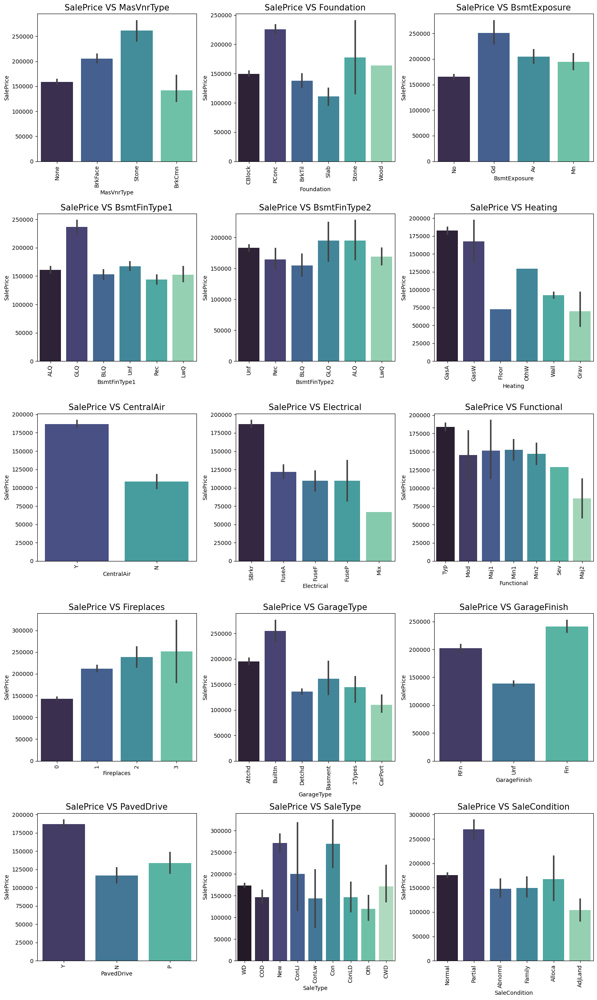

In [32]:
nom_data1 = ['MasVnrType','Foundation','BsmtExposure','BsmtFinType1','BsmtFinType2','Heating','CentralAir','Electrical','Functional','Fireplaces','GarageType','GarageFinish','PavedDrive','SaleType','SaleCondition']
plt.style.use('default')
plt.figure(figsize=(15,25))
for i in range(len(nom_data1)):
    plt.subplot(5,3,i+1)
    sns.barplot(y=df_train['SalePrice'],x=df_train[nom_data1[i]],palette="mako")
    plt.title(f"SalePrice VS {nom_data1[i]}",fontsize=15)
    plt.xticks(rotation = 90)  
    plt.tight_layout()

Observations:
    
•	SalePrice vs MasVnrType: Houses having Stone Masonry veneer type have high sale price than other types.
•	SalePrice vs Foundation: Houses having Poured Concrete as foundation type have high sale price compared to other types.
•	SalePrice vs BsmtExposure: Houses having good walkout or garden level walls have high sale price compared to others.
•	SalePrice vs BsmtFinType1: The sale price is high for the houses containing good living quarters basement finished area.
•	SalePrice vs BsmtFinType2: The sale price is moderately high for the houses having good living quarters and average living quarters.
•	SalePrice vs Heating: The houses having the heating type gas forced warm air furnace and gas hot water or steam heat have high sale price.
•	SalePrice vs CentralAir: Most of the houses have central air conditioning so it is obvious that these houses have high sale price.
•	SalePrice vs Electrical: Most of the houses having standard circuit breakers & romex have high sale price compared to others.
•	SalePrice vs Functional: The houses having the typical functionality have maximum sales price and others have average sale price.
•	SalePrice vs FireplaceQu: The houses having excellent exceptional masonry fireplace quality have high sale price and the houses having poor fireplace quality have very less sale price compared to others.
•	SalePrice vs GarageType: The houses having built-in garage have high sale price compared to others.
•	SalePrice vs GarageFinish: Garages located inside the house which is got finished have high sale price.
•	SalePrice vs PavedDrive: Houses having paved driveways have high sale price.
•	SalePrice vs SaleType: Many houses having sale types as just constructed and sold, and Contract 15% Down payment regular terms have high sale price.
•	SalePrice vs SaleCondition: Houses having partial sale condition that is home was not completed when last assessed have high sale price.


###### Plotting Ordinal Variables vs SalePrice

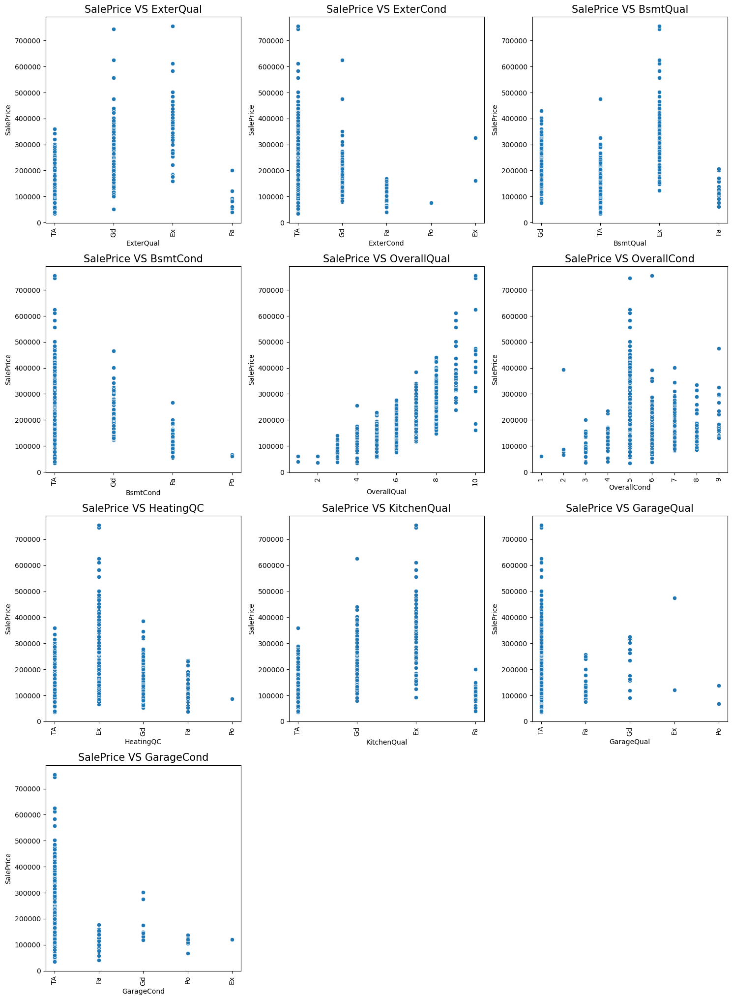

In [34]:
ord_data = ['ExterQual','ExterCond','BsmtQual','BsmtCond','OverallQual','OverallCond','HeatingQC','KitchenQual','GarageQual','GarageCond']
plt.style.use('default')
plt.figure(figsize=(15,25))
for i in range(len(ord_data)):
    plt.subplot(5,3,i+1)
    sns.scatterplot(y=df_train['SalePrice'],x=df_train[ord_data[i]],palette="magma")
    plt.title(f"SalePrice VS {ord_data[i]}",fontsize=15)
    plt.xticks(rotation = 90)  
    plt.tight_layout()

Observations:
    
•	SalePrice vs ExterQual: Houses having excellent quality of the material on the exterior have high sale price and houses having fair quality have very less sale price.
•	SalePrice vs ExterCond: Houses having excellent condition of the material on the exterior have high sale price and the houses having poor condition of the material on the exterior have very less sale price compared to others.
•	SalePrice vs BsmtQual: The houses which evaluates the excellent quality of height of the basement have high sale price compared to others.
•	SalePrice vs BsmtCond: The houses which evaluates the good quality of general condition of the basement have high sale price compared to others.
•	SalePrice vs OverallQual: The houses which have very excellent overall quality like material and finish of the house have high sale price. Also, we can observe from the plot as the overall quality of the house increases, the sale price also increases. That is there is good linear relation between SalePrice and OverallQual.
•	SalePrice vs OverallCond: The houses having overall condition as excellent, and average have very high sale price compared to others.
•	SalePrice vs HeatingQC: Most of the houses having excellent heating quality and condition have high sale price.
•	SalePrice vs KitchenQual: Houses having excellent quality of the kitchen have high sale price compared to others.
•	SalePrice vs GarageQual: The sale price of the house is high for the houses having excellent garage quality.
•	SalePrice vs GarageCond: Houses having typical/average garage condition have high sale price and the houses having good garage condition also have high sales price compared to others.


###### Plotting Continuous variables vs SalePrice

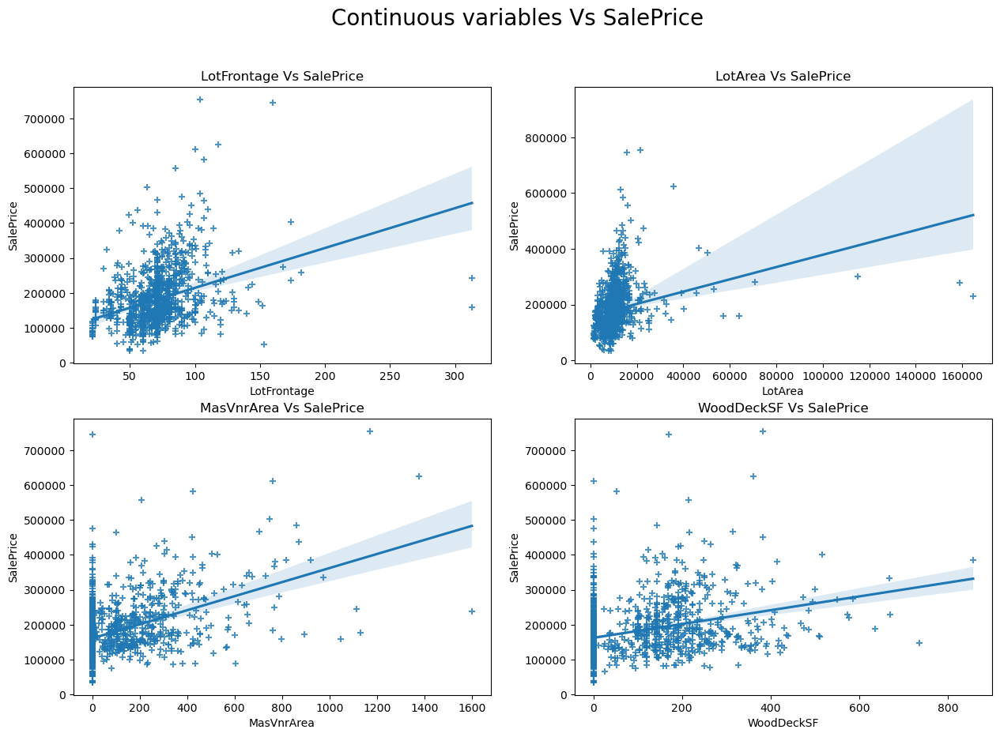

In [37]:
plt.figure(figsize=(15,10))
plt.suptitle('Continuous variables Vs SalePrice',fontsize=20)

plt.subplot(2,2,1)
plt.title('LotFrontage Vs SalePrice')
sns.regplot(x='LotFrontage',y='SalePrice',data=df_train,marker="+")

plt.subplot(2,2,2)
plt.title('LotArea Vs SalePrice')
sns.regplot(x='LotArea',y='SalePrice',data=df_train,marker="+")

plt.subplot(2,2,3)
plt.title('MasVnrArea Vs SalePrice')
sns.regplot(x='MasVnrArea',y='SalePrice',data=df_train,marker="+")

plt.subplot(2,2,4)
plt.title('WoodDeckSF Vs SalePrice')
sns.regplot(x='WoodDeckSF',y='SalePrice',data=df_train,marker="+")
plt.show()

Observations:

•	SalePrice vs LotFrontage: From the plot we can observe there is not much linear relation between the label and feature. If the linear feet of street connected to property is more, the sale price is also high.
•	SalePrice vs LotArea: There is weakly positive linear relation between the label and feature. But the sale price is high when lot size has around 20000 square feet area. Also, as the lot size increases the price is also increasing moderately.
•	SalePrice vs MasVnrArea: There is bit positive linear relation between feature and target. Also, the sale price is high when Masonry veneer area has around 50-400 square feet. So as the Masonry veneer area in square feet increases sale price is also increasing.
•	SalePrice vs WoodDeckSF: There is weakly positive linear relation between the feature and target. As the Wood deck area increases, sale price is also increases.


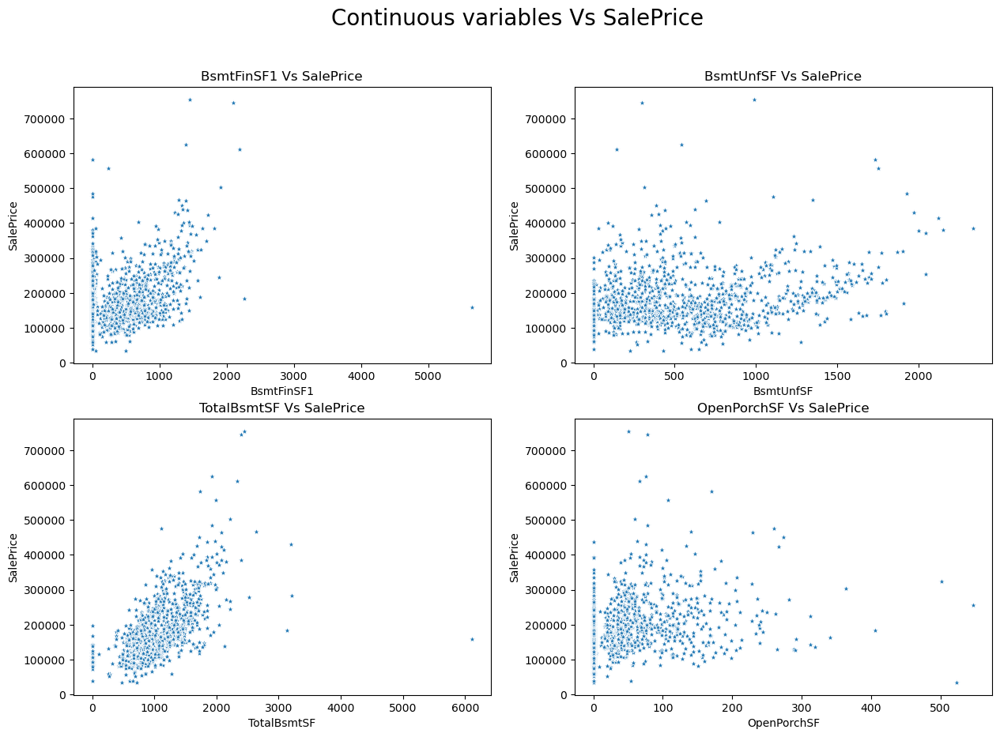

In [38]:
plt.style.use('default')
plt.figure(figsize=(15,10))
plt.suptitle('Continuous variables Vs SalePrice',fontsize=20)

plt.subplot(2,2,1)
plt.title('BsmtFinSF1 Vs SalePrice')
sns.scatterplot(x='BsmtFinSF1',y='SalePrice',data=df_train,marker="*")

plt.subplot(2,2,2)
plt.title('BsmtUnfSF Vs SalePrice')
sns.scatterplot(x='BsmtUnfSF',y='SalePrice',data=df_train,marker="*")

plt.subplot(2,2,3)
plt.title('TotalBsmtSF Vs SalePrice')
sns.scatterplot(x='TotalBsmtSF',y='SalePrice',data=df_train,marker="*")

plt.subplot(2,2,4)
plt.title('OpenPorchSF Vs SalePrice')
sns.scatterplot(x='OpenPorchSF',y='SalePrice',data=df_train,marker="*")
plt.show()

Observations

•	SalePrice vs BsmtFinSF1: There is weakly positive linear relation between feature and label. The sale price is high that is 100000-300000 when basement square feet lie upto 1500 square feet. So as the type 1 basement finished square feet increases, sale price is also increases.
•	SalePrice vs BsmtUnfSF: There is positive linear relation between the target and BsmtUnfSF. When the unfinished basement area is below 1000 square feet, the sale price is high.
•	SalePrice vs TotalBsmtSF: There is positive linear relation between sale price and TotalBsmtSF. As total basement area increases, sale price also increases.
•	SalePrice vs OpenPorchSF: There is a linear relation between the label and feature. The sale price is high when Open porch area is below 200sf. Here also as the Open porch area increases, sale price is also increases.


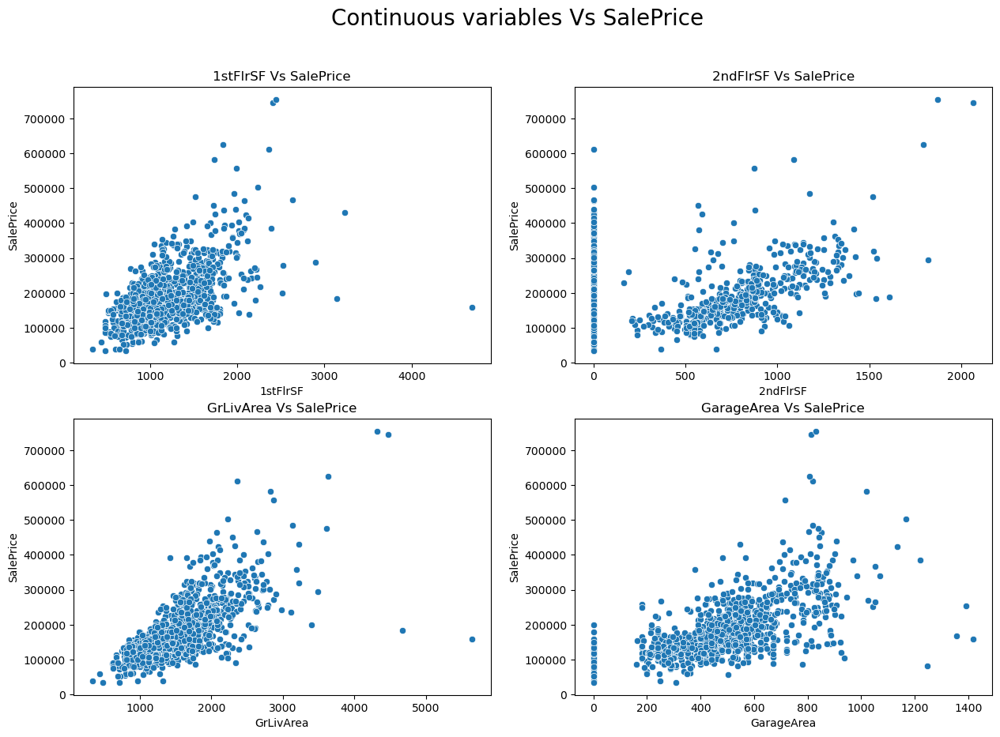

In [40]:
plt.figure(figsize=(15,10))
plt.suptitle('Continuous variables Vs SalePrice',fontsize=20)

plt.subplot(2,2,1)
plt.title('1stFlrSF Vs SalePrice')
sns.scatterplot(x='1stFlrSF',y='SalePrice',data=df_train)

plt.subplot(2,2,2)
plt.title('2ndFlrSF Vs SalePrice')
sns.scatterplot(x='2ndFlrSF',y='SalePrice',data=df_train)

plt.subplot(2,2,3)
plt.title('GrLivArea Vs SalePrice')
sns.scatterplot(x='GrLivArea',y='SalePrice',data=df_train)

plt.subplot(2,2,4)
plt.title('GarageArea Vs SalePrice')
sns.scatterplot(x='GarageArea',y='SalePrice',data=df_train)
plt.show()

Observations:
    
•	SalePrice vs 1stFlrSF: There is a linear relation between the label and feature. As we can observe in the plot, the sale price is high when the first-floor area lies between 500-2000 square feet. So as the 1st floor area increases, sales price also increases moderately.
•	SalePrice vs 2ndFlrSF: There is a positive correlation between SalePrice and 2ndFlrSF. So, the sale price increases based on the floors.
•	SalePrice vs GrLivArea: Most of the houses have above grade living area. There is a positive correlation between the label and feature. Here as the above grade living area increases, sale price also increases.
•	SalePrice vs GarageArea: Like 2nd floor sf, here also positive linear relation between the label and feature. As size of garage area increases, sale price also increases. The sale price is high when size of garage area is between 200-800 square feet.


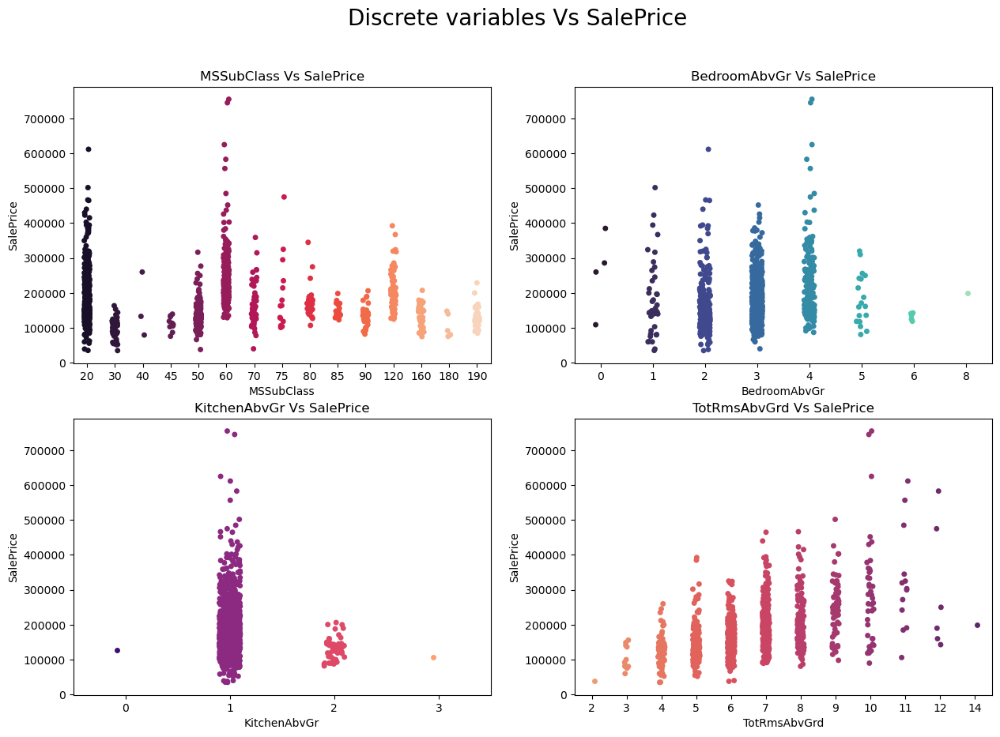

In [41]:
plt.style.use('default')
plt.figure(figsize=(15,10))
plt.suptitle('Discrete variables Vs SalePrice',fontsize=20)

plt.subplot(2,2,1)
plt.title('MSSubClass Vs SalePrice')
sns.stripplot(x='MSSubClass',y='SalePrice',data=df_train,palette="rocket")

plt.subplot(2,2,2)
plt.title('BedroomAbvGr Vs SalePrice')
sns.stripplot(x='BedroomAbvGr',y='SalePrice',data=df_train,palette='mako')

plt.subplot(2,2,3)
plt.title('KitchenAbvGr Vs SalePrice')
sns.stripplot(x='KitchenAbvGr',y='SalePrice',data=df_train,palette="magma")

plt.subplot(2,2,4)
plt.title('TotRmsAbvGrd Vs SalePrice')
sns.stripplot(x='TotRmsAbvGrd',y='SalePrice',data=df_train,palette='flare')
plt.show()

Observations:
    
•	SalePrice vs MSSubClass: The sale price is high for the MSSubClass 20,60 and 120
•	SalePrice vs BedroomAbvGr: Many houses are having 0 and 4 bedrooms have high sales price also houses having 8 bedrooms also have high sales price. Other bedroom grades have average sale price.
•	SalePrice vs KitchenAbvGr: Most of the houses have single kitchen and few houses have 2 kitchens. The sale price is also high in case of the houses having single kitchen.
•	SalePrice vs TotRmsAbvGrd: We can observe some linear relation between Total rooms above grade and Sale Prices as the number of rooms increases the sales price also increases.


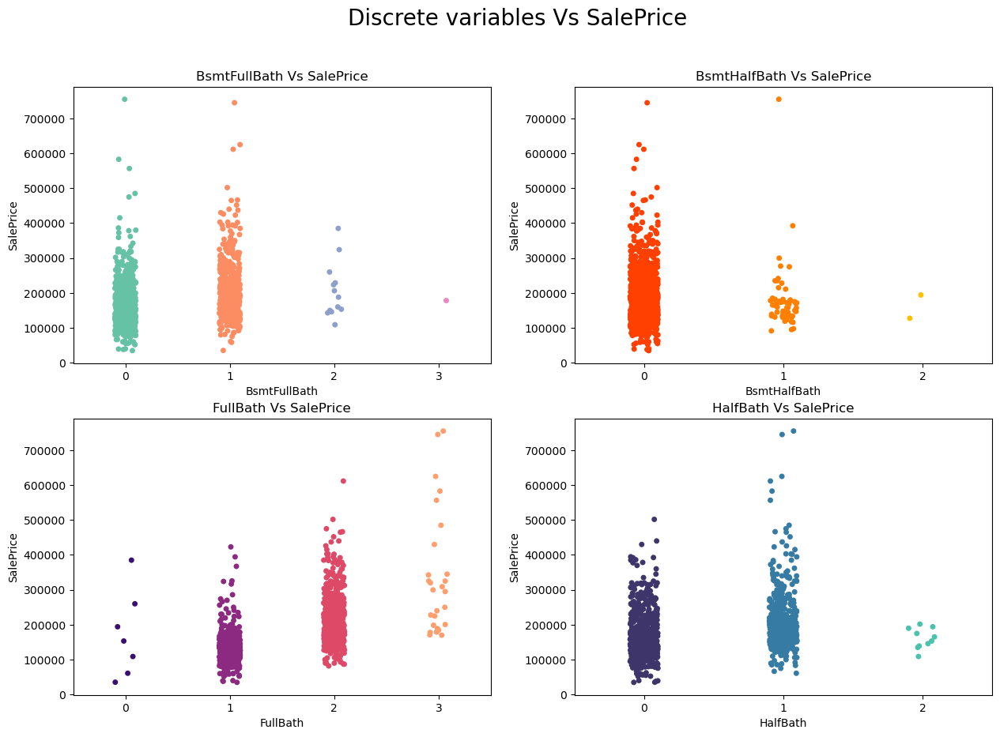

In [42]:
plt.style.use('default')
plt.figure(figsize=(15,10))
plt.suptitle('Discrete variables Vs SalePrice',fontsize=20)

plt.subplot(2,2,1)
plt.title('BsmtFullBath Vs SalePrice')
sns.stripplot(x='BsmtFullBath',y='SalePrice',data=df_train,palette="Set2")

plt.subplot(2,2,2)
plt.title('BsmtHalfBath Vs SalePrice')
sns.stripplot(x='BsmtHalfBath',y='SalePrice',data=df_train,palette='autumn')

plt.subplot(2,2,3)
plt.title('FullBath Vs SalePrice')
sns.stripplot(x='FullBath',y='SalePrice',data=df_train,palette="magma")

plt.subplot(2,2,4)
plt.title('HalfBath Vs SalePrice')
sns.stripplot(x='HalfBath',y='SalePrice',data=df_train,palette='mako')
plt.show()

Observations:
    
•	SalesPrice vs BsmtFullBath: Most of the houses have basement full bathrooms as 0 and 1 which means some of the houses have single basement bathrooms and some of the houses have no basement bathrooms. And sales price is also high in these cases.
•	SalesPrice vs BsmtHalfBath: The houses do not have any single basement bathrooms and those houses have average sales price.
•	SalesPrice vs FullBath: There is positive linear relation between the sale price and full bathrooms above grade. Large number of houses have 1-2 full bathrooms. As the full bathrooms grades increases, sale price is also increasing slightly.
•	SalesPrice vs HalfBath: Some of the houses have no half bathrooms and also some of the houses have single half bathroom and very few houses have 2 half bathrooms. The houses with 0-1 half bathrooms have average sale price.


### Outliers

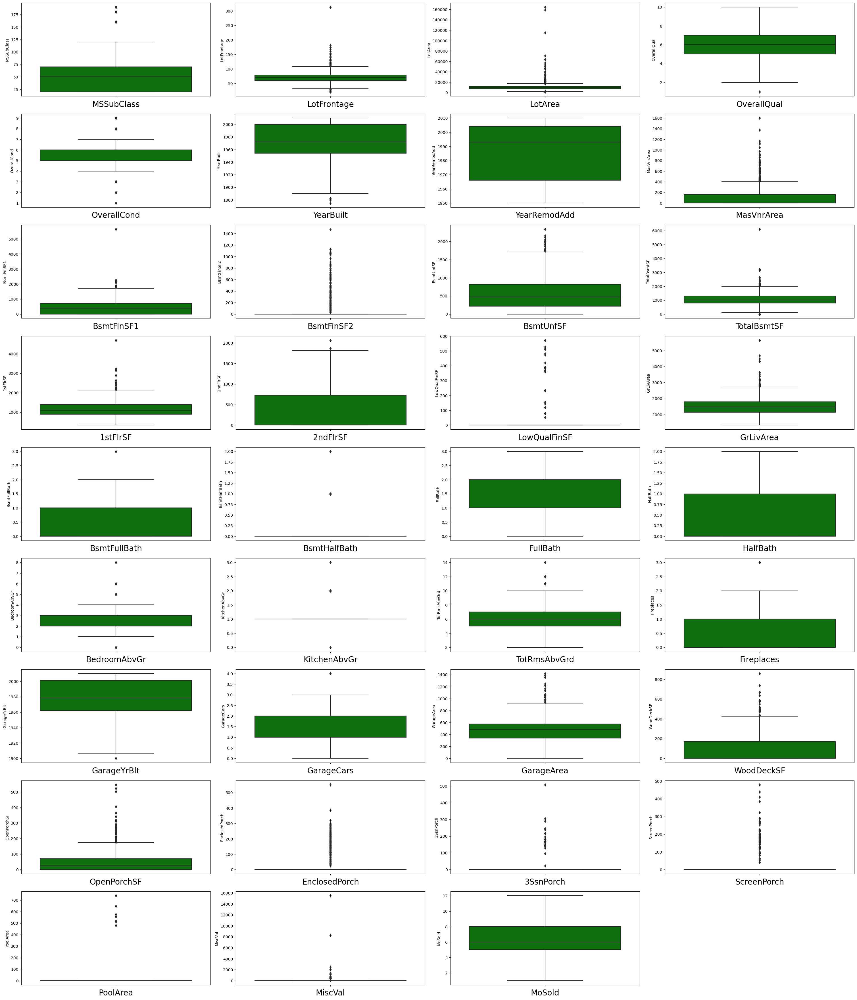

In [43]:
#Let's check the Outliers through Boxplot

plt.figure(figsize=(30,35), facecolor='white')
plotnumber = 1

for column in Num_data:
    if plotnumber<=35:
        ax = plt.subplot(9,4,plotnumber)
        sns.boxplot(y=column, data=df_train,color='g')
        plt.xlabel(column,fontsize=20)
    plotnumber+=1
plt.tight_layout(pad=0.1, w_pad=0.5, h_pad=1.0)
plt.show()

All the columns contains outliers except FullBath, HalfBath, MoSold, YrSold and AgeRemod.

The columns OverallQual and OverallCond seems to be categorical also, the column SalePrice is the label so I am not removing outliers in these columns.

Let's remove the outliers in the remaining columns using both Zscore and IQR method and compare the dataloss.

##### Removing outliers using Zscore

In [44]:
# Features containing outliers
df1 = df_train[['MSSubClass', 'LotFrontage', 'LotArea', 'MasVnrArea', 'BsmtFinSF1', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch','PoolArea','MiscVal']]

In [46]:
# Using zscore to remove outliers in the feature newpaper
from scipy.stats import zscore

z=np.abs(zscore(df1))

# Creating new dataframe
new_df1=df_train[(z<3).all(axis=1)]
new_df1

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,120,RL,70.98847,4928,Pave,IR1,Lvl,Inside,Gtl,NPkVill,Norm,Norm,TwnhsE,1Story,6,5,1976,1976,Gable,CompShg,Plywood,Plywood,None,0.000000,TA,TA,CBlock,Gd,TA,No,ALQ,120,Unf,0,958,1078,GasA,TA,Y,SBrkr,958,0,0,958,0,0,2,0,2,1,TA,5,Typ,1,Attchd,1977.000000,RFn,2,440,TA,TA,Y,0,205,0,0,0,0,0,2,2007,WD,Normal,128000
1,20,RL,95.00000,15865,Pave,IR1,Lvl,Inside,Mod,NAmes,Norm,Norm,1Fam,1Story,8,6,1970,1970,Flat,Tar&Grv,Wd Sdng,Wd Sdng,None,0.000000,Gd,Gd,PConc,TA,Gd,Gd,ALQ,351,Rec,823,1043,2217,GasA,Ex,Y,SBrkr,2217,0,0,2217,1,0,2,0,4,1,Gd,8,Typ,1,Attchd,1970.000000,Unf,2,621,TA,TA,Y,81,207,0,0,224,0,0,10,2007,WD,Normal,268000
2,60,RL,92.00000,9920,Pave,IR1,Lvl,CulDSac,Gtl,NoRidge,Norm,Norm,1Fam,2Story,7,5,1996,1997,Gable,CompShg,MetalSd,MetalSd,None,0.000000,Gd,TA,PConc,Gd,TA,Av,GLQ,862,Unf,0,255,1117,GasA,Ex,Y,SBrkr,1127,886,0,2013,1,0,2,1,3,1,TA,8,Typ,1,Attchd,1997.000000,Unf,2,455,TA,TA,Y,180,130,0,0,0,0,0,6,2007,WD,Normal,269790
3,20,RL,105.00000,11751,Pave,IR1,Lvl,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1977,1977,Hip,CompShg,Plywood,Plywood,BrkFace,480.000000,TA,TA,CBlock,Gd,TA,No,BLQ,705,Unf,0,1139,1844,GasA,Ex,Y,SBrkr,1844,0,0,1844,0,0,2,0,3,1,TA,7,Typ,1,Attchd,1977.000000,RFn,2,546,TA,TA,Y,0,122,0,0,0,0,0,1,2010,COD,Normal,190000
5,60,RL,58.00000,14054,Pave,IR1,Lvl,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,7,5,2006,2006,Gable,CompShg,VinylSd,VinylSd,None,0.000000,Gd,TA,PConc,Gd,TA,Av,Unf,0,Unf,0,879,879,GasA,Ex,Y,SBrkr,879,984,0,1863,0,0,2,1,4,1,Gd,9,Typ,1,BuiltIn,2006.000000,Fin,3,660,TA,TA,Y,100,17,0,0,0,0,0,11,2006,New,Partial,219210
6,20,RL,70.98847,11341,Pave,IR1,Lvl,Inside,Gtl,Sawyer,Norm,Norm,1Fam,1Story,5,6,1957,1996,Hip,CompShg,Wd Sdng,Wd Sdng,BrkFace,180.000000,TA,TA,CBlock,Gd,TA,No,ALQ,1302,Unf,0,90,1392,GasA,TA,Y,SBrkr,1392,0,0,1392,1,0,1,1,3,1,TA,5,Mod,1,Detchd,1957.000000,Unf,2,528,TA,TA,Y,0,0,0,0,95,0,0,5,2010,WD,Normal,121500
7,20,RL,88.00000,13125,Pave,Reg,Lvl,Corner,Gtl,Sawyer,Norm,Norm,1Fam,1Story,5,4,1957,2000,Gable,CompShg,Wd Sdng,Wd Sdng,BrkCmn,67.000000,TA,TA,CBlock,TA,TA,No,Rec,168,BLQ,682,284,1134,GasA,Ex,Y,SBrkr,1803,0,0,1803,1,0,2,0,3,1,TA,8,Maj1,1,Attchd,1957.000000,RFn,2,484,TA,TA,Y,0,0,0,0,0,0,0,1,2006,WD,Normal,155000
8,20,RL,70.00000,9170,Pave,Reg,Lvl,Corner,Gtl,Edwards,Feedr,Norm,1Fam,1Story,5,7,1965,1965,Hip,CompShg,MetalSd,MetalSd,None,0.000000,TA,TA,CBlock,TA,TA,No,ALQ,698,GLQ,96,420,1214,GasA,Ex,Y,SBrkr,1214,0,0,1214,1,0,1,0,2,1,TA,6,Typ,0,Detchd,1965.000000,Unf,2,461,Fa,Fa,Y,0,0,184,0,0,0,400,4,2007,WD,Normal,140000
9,50,RL,80.00000,8480,Pave,Reg,Lvl,Inside,Gtl,NAmes,Norm,Norm,1Fam,1.5Fin,5,5,1947,1950,Gable,CompShg,MetalSd,MetalSd,None,0.000000,TA,TA,CBlock,TA,TA,No,Rec,442,Unf,0,390,832,GasA,TA,Y,SBrkr,832,384,0,1216,0,0,1,0,2,1,TA,6,Typ,0,Detchd,1947.000000,Unf,1,336,TA,TA,Y,158,0,102,0,0,0,0,10,2008,COD,Abnorml,118500
10,50,RM,50.00000,8600,Pave,Reg,Bnk,Inside,Gtl,IDOTRR,Norm,Norm,1Fam,1.5Fin,6,6,1937,1950,Gable,CompShg,MetalSd,MetalSd,None,0.000000,TA,TA,BrkTil,TA,TA,No,Unf,0,Unf,0,780,780,GasA,TA,Y,SBrkr,780,596,0,1376,0,0,2,0,3,1,TA,7,Typ,1,Detchd,1937.000000,Unf,1,198,TA,TA,N,0,0,0,0,0,0,0,6,2006,WD,Normal,119500


In [47]:
# Checking the shape of dataset before and after removing outliers
print("Shape of train dataset before removing outliers:", df_train.shape)
print("Shape of train dataset after removing outliers:", new_df1.shape)

Shape of train dataset before removing outliers: (1168, 74)
Shape of train dataset after removing outliers: (889, 74)


In [48]:
# Let's check the the data loss
data_loss = (1168-889)/1168*100
data_loss

23.886986301369863

Around 24% of data is lost, So we will check with other method

##### IQR (Inter Quantile Range) method

In [50]:
# 1st quantile
Q1=df1.quantile(0.25)

# 3rd quantile
Q3=df1.quantile(0.75)

# IQR
IQR=Q3 - Q1

train_df1=df_train[~((df_train < (Q1 - 1.5 * IQR)) |(df_train > (Q3 + 1.5 * IQR))).any(axis=1)]

In [51]:
print("Shape of train data after using IQR method:", train_df1.shape)

Shape of train data after using IQR method: (603, 74)


In [52]:
# Checking the the data loss after removing outliers
data_loss = (1168-603)/1168*100
data_loss

48.37328767123288

Data loss by IQR is very high, we will check percentile method

##### Percentile Method

In [53]:
# Removing outliers in train data using percentile method 
for col in df1:
    if df_train[col].dtypes != 'object':
        percentile = df_train[col].quantile([0.01,0.98]).values
        df_train[col][df_train[col]<=percentile[0]]=percentile[0]
        df_train[col][df_train[col]>=percentile[1]]=percentile[1]

I have removed the outliers present in train dataset using percentile method.

### Skewness

In [55]:
# Checking the skewness
df_train.skew()

MSSubClass       1.422019
LotFrontage      0.188060
LotArea          1.191912
OverallQual      0.175082
OverallCond      0.580714
YearBuilt       -0.579204
YearRemodAdd    -0.495864
MasVnrArea       1.873138
BsmtFinSF1       0.639523
BsmtFinSF2       4.365829
BsmtUnfSF        0.777624
TotalBsmtSF      0.166773
1stFlrSF         0.645842
2ndFlrSF         0.717390
LowQualFinSF     8.666142
GrLivArea        0.592755
BsmtFullBath     0.355224
BsmtHalfBath     3.954345
FullBath         0.057809
HalfBath         0.656492
BedroomAbvGr    -0.145762
KitchenAbvGr     4.374289
TotRmsAbvGrd     0.443931
Fireplaces       0.552677
GarageYrBlt     -0.662934
GarageCars      -0.434745
GarageArea      -0.135675
WoodDeckSF       1.053617
OpenPorchSF      1.513678
EnclosedPorch    2.623505
3SsnPorch        0.000000
ScreenPorch      4.105741
PoolArea         0.000000
MiscVal          5.131980
MoSold           0.220979
YrSold           0.115765
SalePrice        1.953878
dtype: float64

Features contains skewness where value more than +0.5 and -0.5
Since SalePrice is label, so no need to remove skewness in these columns. Let's remove skewenss present in the remaining columns.

##### Removing skewness through yeo-johnson

In [56]:
# Removing skewness using yeo-johnson  method to get better prediction
skew1 = ["MSSubClass","LotArea","YearBuilt","MasVnrArea","BsmtFinSF1","BsmtFinSF2","BsmtUnfSF","1stFlrSF","2ndFlrSF","LowQualFinSF","GrLivArea","BsmtHalfBath","HalfBath","KitchenAbvGr","Fireplaces","GarageYrBlt","WoodDeckSF","OpenPorchSF","EnclosedPorch","ScreenPorch","MiscVal"]

from sklearn.preprocessing import PowerTransformer
scaler = PowerTransformer(method='yeo-johnson')
'''
parameters:
method = 'box-cox' or 'yeo-johnson'
'''

"\nparameters:\nmethod = 'box-cox' or 'yeo-johnson'\n"

In [57]:
df_train[skew1] = scaler.fit_transform(df_train[skew1].values)
df_train[skew1].head()

,MSSubClass,LotArea,YearBuilt,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtHalfBath,HalfBath,KitchenAbvGr,Fireplaces,GarageYrBlt,WoodDeckSF,OpenPorchSF,EnclosedPorch,ScreenPorch,MiscVal
0,1.370435,-1.306083,0.026859,-0.822896,-0.117054,-0.363019,0.916764,-0.481887,-0.871789,-0.14173,-1.281768,-0.238775,-0.782707,0.0,0.779453,-0.219139,-0.960144,1.423871,-0.411301,-0.297551,-0.193133
1,-1.167999,1.356458,-0.185817,-0.822896,0.395541,2.756067,1.042594,2.082190,-0.871789,-0.14173,1.377184,-0.238775,-0.782707,0.0,0.779453,-0.505658,0.783831,1.428474,-0.411301,3.360787,-0.193133
2,0.490047,0.113089,0.836680,-0.822896,0.934402,-0.363019,-0.510359,0.048689,1.177246,-0.14173,1.060650,-0.238775,1.268421,0.0,0.779453,0.769650,1.047285,1.208580,-0.411301,-0.297551,-0.193133
3,-1.167999,0.530989,0.063582,1.385487,0.803940,-0.363019,1.178365,1.665038,-0.871789,-0.14173,0.775546,-0.238775,-0.782707,0.0,0.779453,-0.219139,-0.960144,1.178672,-0.411301,-0.297551,-0.193133
4,-1.167999,1.497522,0.063582,1.140684,1.189724,-0.363019,-0.230032,1.201931,-0.871789,-0.14173,0.322952,4.188040,-0.782707,0.0,0.779453,-0.219139,1.139237,-1.062308,-0.411301,-0.297551,-0.193133


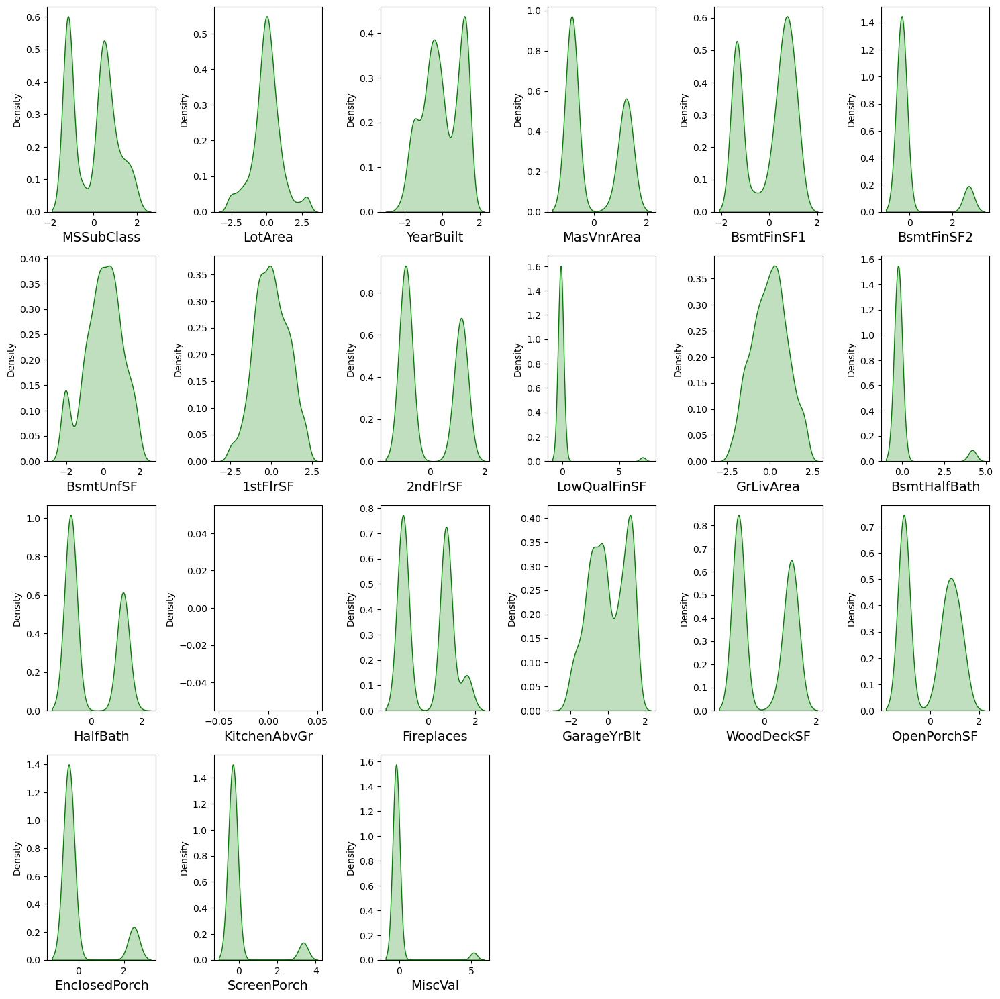

In [60]:
# Checking how the data has been distriubted in each column after removing skewness

plt.figure(figsize=(15,15),facecolor='white')
plotnumber=1
for column in df_train[skew1] :
    if plotnumber<=21:
        ax=plt.subplot(4,6,plotnumber)
        sns.distplot(df_train[column],color="g",kde_kws={"shade": True},hist=False)
        plt.xlabel(column,fontsize=14)
    plotnumber+=1
plt.tight_layout()
plt.show()

In [61]:
# Checking skewness after using yeo-johnson method
df_train[skew1].skew()

MSSubClass       0.064007
LotArea          0.077861
YearBuilt       -0.126641
MasVnrArea       0.415092
BsmtFinSF1      -0.418554
BsmtFinSF2       2.394737
BsmtUnfSF       -0.304290
1stFlrSF        -0.000731
2ndFlrSF         0.279883
LowQualFinSF     6.922843
GrLivArea       -0.005974
BsmtHalfBath     3.954345
HalfBath         0.498003
KitchenAbvGr     0.000000
Fireplaces       0.076595
GarageYrBlt     -0.132523
WoodDeckSF       0.110387
OpenPorchSF     -0.010092
EnclosedPorch    2.022615
ScreenPorch      3.067153
MiscVal          4.991071
dtype: float64

The column KitchenAbvGr,PoolArea,3SsnPorch has skewness zero which means it contains only one unique value that is zero throughout the dataset, So I can drop this column as well.

In [63]:
# Dropping irrelevant colum
df_train.drop("KitchenAbvGr",axis=1,inplace=True)
df_train.drop("PoolArea",axis=1,inplace=True)
df_train.drop("3SsnPorch",axis=1,inplace=True)

### Encoding

In [66]:
cat_data = ['ExterQual','ExterCond','BsmtQual','BsmtCond','HeatingQC','KitchenQual','Fireplaces','GarageQual','GarageCond']
for i in cat_data:
    df_train[i] = df_train[i].replace({'Ex':5, 'Gd':4, 'TA':3, 'Fa':2, 'Po':1, 'None':0})

In [69]:
# Encoding train dataframe using OrdinalEncoder
from sklearn.preprocessing import OrdinalEncoder
enc = OrdinalEncoder()
for i in df_train.columns:
    if df_train[i].dtypes == "object":
        df_train[i] = enc.fit_transform(df_train[i].values.reshape(-1,1))

In [70]:
df_train.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,ScreenPorch,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1.370435,3.0,70.98847,-1.306083,1.0,0.0,3.0,4.0,0.0,13.0,2.0,2.0,4.0,2.0,6,5,0.026859,1976,1.0,1.0,8.0,9.0,2.0,-0.822896,3,3,1.0,4,3,3.0,0.0,-0.117054,5.0,-0.363019,0.916764,1078.00,1.0,3,1.0,4.0,-0.481887,-0.871789,-0.14173,-1.281768,0,-0.238775,2,-0.782707,2.0,3,5.0,6.0,0.779453,1.0,-0.219139,1.0,2,440.0,3,3,2.0,-0.960144,1.423871,-0.411301,-0.297551,-0.193133,2,2007,8.0,4.0,128000
1,-1.167999,3.0,95.00000,1.356458,1.0,0.0,3.0,4.0,1.0,12.0,2.0,2.0,0.0,2.0,8,6,-0.185817,1970,0.0,5.0,12.0,13.0,2.0,-0.822896,4,4,2.0,3,4,1.0,0.0,0.395541,4.0,2.756067,1.042594,2025.14,1.0,5,1.0,4.0,2.082190,-0.871789,-0.14173,1.377184,1,-0.238775,2,-0.782707,4.0,4,8.0,6.0,0.779453,1.0,-0.505658,2.0,2,621.0,3,3,2.0,0.783831,1.428474,-0.411301,3.360787,-0.193133,10,2007,8.0,4.0,268000
2,0.490047,3.0,92.00000,0.113089,1.0,0.0,3.0,1.0,0.0,15.0,2.0,2.0,0.0,5.0,7,5,0.836680,1997,1.0,1.0,7.0,7.0,2.0,-0.822896,4,3,2.0,4,3,0.0,2.0,0.934402,5.0,-0.363019,-0.510359,1117.00,1.0,5,1.0,4.0,0.048689,1.177246,-0.14173,1.060650,1,-0.238775,2,1.268421,3.0,3,8.0,6.0,0.779453,1.0,0.769650,2.0,2,455.0,3,3,2.0,1.047285,1.208580,-0.411301,-0.297551,-0.193133,6,2007,8.0,4.0,269790
3,-1.167999,3.0,105.00000,0.530989,1.0,0.0,3.0,4.0,0.0,14.0,2.0,2.0,0.0,2.0,6,6,0.063582,1977,3.0,1.0,8.0,9.0,1.0,1.385487,3,3,1.0,4,3,3.0,1.0,0.803940,5.0,-0.363019,1.178365,1844.00,1.0,5,1.0,4.0,1.665038,-0.871789,-0.14173,0.775546,0,-0.238775,2,-0.782707,3.0,3,7.0,6.0,0.779453,1.0,-0.219139,1.0,2,546.0,3,3,2.0,-0.960144,1.178672,-0.411301,-0.297551,-0.193133,1,2010,0.0,4.0,190000
4,-1.167999,3.0,70.98847,1.497522,1.0,0.0,3.0,2.0,0.0,14.0,2.0,2.0,0.0,2.0,6,7,0.063582,2000,1.0,1.0,4.0,4.0,3.0,1.140684,4,3,1.0,4,3,3.0,0.0,1.189724,5.0,-0.363019,-0.230032,1602.00,1.0,4,1.0,4.0,1.201931,-0.871789,-0.14173,0.322952,0,4.188040,2,-0.782707,3.0,4,8.0,6.0,0.779453,1.0,-0.219139,0.0,2,529.0,3,3,2.0,1.139237,-1.062308,-0.411301,-0.297551,-0.193133,6,2009,8.0,4.0,215000


We have encoded object data types into numerical using OrdinalEncoder method.

### Correlation

In [71]:
# Checking the correlation between features and the target
cor = df_train.corr()
cor

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,ScreenPorch,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
MSSubClass,1.000000,0.026898,-0.316274,-0.312939,-0.017924,0.067516,-0.030467,0.057130,-0.016595,-0.011619,-0.039101,-0.031881,0.586409,0.481353,0.122241,-0.033927,0.017353,0.052458,-0.138069,-0.028166,-0.048778,-0.069930,-0.028288,0.004875,0.062077,-0.031109,0.048143,0.076728,-0.006384,-0.060011,0.084234,-0.100436,0.056615,-0.085279,-0.116225,-0.293377,0.071533,0.018161,-0.111572,0.036332,-0.312472,0.558561,0.093774,0.230677,-0.067705,0.010020,0.197635,0.295003,0.078793,0.048228,0.192707,0.037758,0.029802,0.104343,0.067702,-0.023714,0.000675,-0.075152,-0.003808,-0.045967,-0.086870,0.038922,0.062935,0.021075,-0.006098,-0.032324,0.010865,-0.042020,0.064683,-0.027825,-0.001252
MSZoning,0.026898,1.000000,-0.084834,-0.058912,0.140215,0.053655,0.001175,-0.027246,-0.023952,-0.251833,-0.025651,0.031959,-0.024776,-0.110991,-0.134037,0.189553,-0.302600,-0.174586,0.000913,0.009719,-0.012037,0.005548,-0.033521,-0.037361,-0.160447,0.097907,-0.244844,-0.206193,-0.041842,0.037414,0.021518,-0.036041,-0.031322,0.030101,-0.032954,-0.065060,0.051188,-0.149446,-0.015887,-0.079205,-0.037611,-0.016193,-0.012805,-0.086858,-0.009900,0.006809,-0.188837,-0.125164,-0.000610,-0.133170,-0.024508,-0.091684,0.009349,0.125155,-0.267850,0.162566,-0.130963,-0.163414,-0.095053,-0.073200,-0.077280,0.006946,-0.182359,0.121891,0.018306,-0.011447,-0.051646,-0.004964,0.079854,0.004501,-0.133221
LotFrontage,-0.316274,-0.084834,1.000000,0.596143,-0.044573,-0.157341,-0.016620,-0.201691,0.023253,0.091671,-0.022579,0.011970,-0.467073,0.057902,0.230687,-0.051887,0.119853,0.080871,0.168101,0.063294,0.079942,0.108934,-0.066054,0.166180,0.158712,-0.001004,0.090652,0.163680,0.047333,-0.121117,-0.028977,0.087060,-0.015941,0.015464,0.130111,0.318263,-0.036713,0.084699,0.087970,0.073880,0.394878,-0.036998,-0.042528,0.318133,0.070859,0.011408,0.180823,0.049731,0.278173,0.158665,0.323070,0.037977,0.227523,-0.243693,0.062693,-0.202471,0.297190,0.334422,0.053380,0.039626,0.106891,0.065003,0.168784,-0.044835,0.036083,0.006895,0.027718,-0.005074,-0.040647,0.076587,0.358470
LotArea,-0.312939,-0.058912,0.596143,1.000000,-0.072669,-0.287003,-0.074834,-0.198998,0.176280,0.075420,0.069366,0.056741,-0.524128,0.005503,0.190547,0.010314,0.015794,0.028632,0.119446,0.220463,0.079181,0.095689,-0.019842,0.076589,0.097839,0.070513,0.009319,0.116129,0.047736,-0.144857,-0.043423,0.119301,-0.073788,0.092385,0.052521,0.332367,-0.021160,0.047385,0.073866,0.053827,0.452791,0.009290,-0.027330,0.397820,0.108691,0.043299,0.187219,0.061575,0.297515,0.127004,0.369388,-0.025038,0.328380,-0.201895,-0.027603,-0.155464,0.272560,0.319552,0.060260,0.030388,0.041033,0.125098,0.146222,-0.019153,0.067760,0.064428,0.021311,-0.039843,-0.022130,0.046115,0.394343
Street,-0.017924,0.140215,-0.044573,-0.072669,1.000000,-0.012941,0.105226,0.000153,-0.141572,0.001420,0.002189,0.001406,-0.013606,0.016793,0.057140,0.031082,0.025284,0.057866,-0.006875,0.007889,0.012482,0.014618,0.000822,0.020075,0.091807,-0.028096,0.032701,0.027107,0.002199,0.065253,-0.006420,0.008924,0.045208,-0.024408,0.030988,0.016841,0.006981,0.038560,0.043024,0.038720,0.009913,0.026241,0.008308,0.052837,-0.010398,0.013997,0.033208,0.045883,0.028722,0.068306,0.039782,-0.015309,0.021069,-0.000824,0.02028

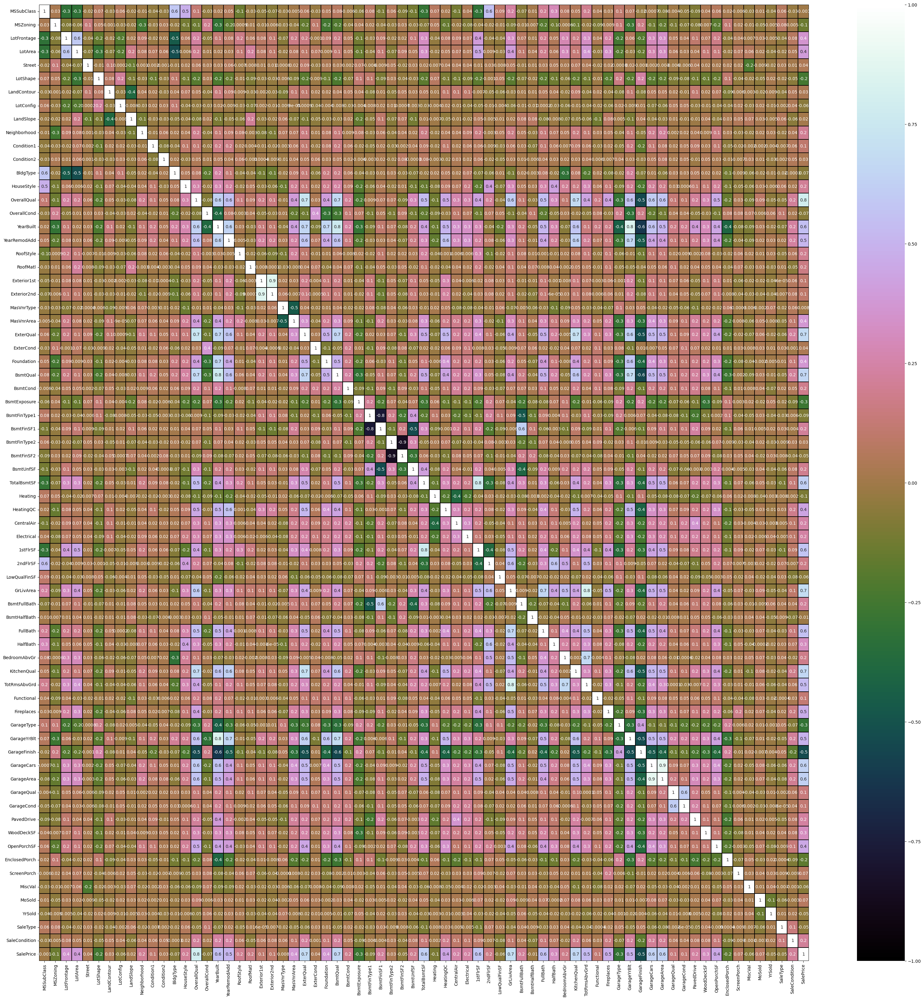

In [76]:
# Visualizing the correlation matrix by plotting heat map.
plt.figure(figsize=(40,40))    
sns.heatmap(df_train.corr(),linewidths=.1,vmin=-1, vmax=1,fmt='.1g',linecolor="black",annot=True,cmap="cubehelix")
plt.yticks(rotation=0);

No of column is quite high and difficult to analyse from above heat map.

In [77]:
cor['SalePrice'].sort_values(ascending=False)

SalePrice        1.000000
OverallQual      0.789185
GrLivArea        0.688210
ExterQual        0.672665
KitchenQual      0.659228
BsmtQual         0.653265
GarageCars       0.634573
GarageArea       0.627504
TotalBsmtSF      0.624311
1stFlrSF         0.575665
FullBath         0.554988
YearBuilt        0.550872
TotRmsAbvGrd     0.528564
YearRemodAdd     0.507831
GarageYrBlt      0.498303
Fireplaces       0.475531
OpenPorchSF      0.449961
HeatingQC        0.431516
LotArea          0.394343
Foundation       0.374169
MasVnrArea       0.373364
LotFrontage      0.358470
WoodDeckSF       0.310128
HalfBath         0.309808
CentralAir       0.246754
Electrical       0.234621
PavedDrive       0.231707
BsmtFullBath     0.218620
SaleCondition    0.217687
BsmtFinSF1       0.212858
HouseStyle       0.205502
Neighborhood     0.198942
BsmtUnfSF        0.193140
RoofStyle        0.192654
BsmtCond         0.181625
BedroomAbvGr     0.177452
2ndFlrSF         0.167816
RoofMatl         0.159865
GarageQual  

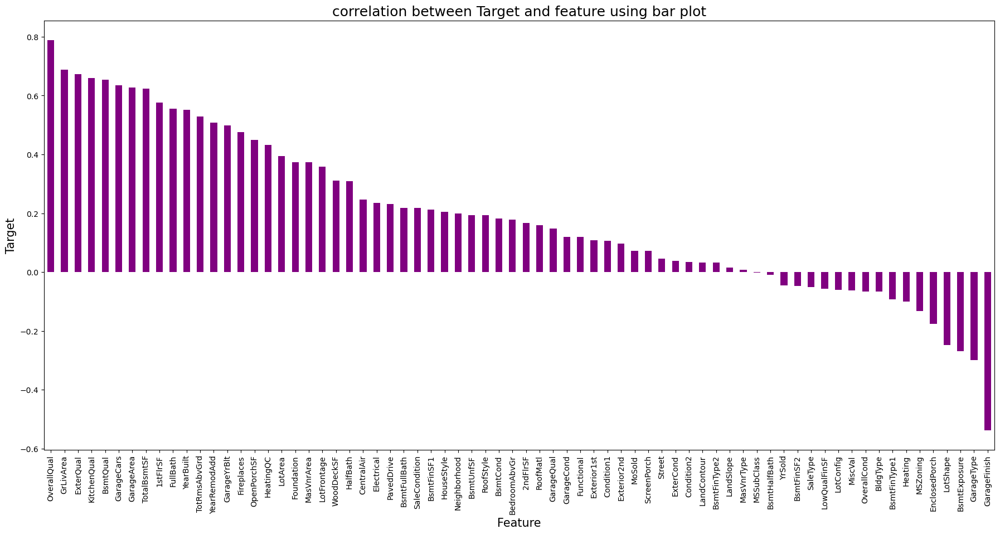

In [78]:
plt.figure(figsize=(22,10))
df_train.corr()['SalePrice'].sort_values(ascending=False).drop(['SalePrice']).plot(kind='bar',color='purple')
plt.xlabel('Feature',fontsize=15)
plt.ylabel('Target',fontsize=15)
plt.title('correlation between Target and feature using bar plot',fontsize=18)
plt.show()

#### Separating the independent and target variables into x and y

In [79]:
x = df_train.drop("SalePrice", axis=1)
y = df_train["SalePrice"]

##### Scaling data with standard scaler

In [81]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
x = pd.DataFrame(scaler.fit_transform(x), columns=x.columns)
x.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,ScreenPorch,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1.370435,-0.021646,0.039092,-1.306083,0.058621,-1.373107,0.318473,0.606420,-0.226126,0.142224,-0.037339,-0.023979,2.985495,-0.549930,-0.075169,-0.530217,0.026859,-0.421565,-0.483544,-0.134573,-0.212927,-0.104890,0.395209,-0.822896,-0.700004,-0.223988,-0.557836,0.647378,-0.037507,0.635539,-1.523529,-0.117054,0.310141,-0.363019,0.916764,0.067300,-0.11909,-1.178317,0.267506,0.299036,-0.481887,-0.871789,-0.14173,-1.281768,-0.838227,-0.238775,0.793082,-0.782707,-1.144966,-0.788838,-1.009429,0.261146,0.779453,-0.693653,-0.219139,-0.288773,0.307737,-0.163806,0.101364,0.110393,0.291828,-0.960144,1.423871,-0.411301,-0.297551,-0.193133,-1.617822,-0.605487,0.330033,0.207932
1,-1.167999,-0.021646,1.321126,1.356458,0.058621,-1.373107,0.318473,0.606420,3.295414,-0.024227,-0.037339,-0.023979,-0.403288,-0.549930,1.364138,0.359572,-0.185817,-0.710356,-1.685203,6.090408,1.079014,1.050880,0.395209,-0.822896,1.032209,2.589114,0.852451,-0.832343,3.332324,-1.113129,-1.523529,0.395541,-0.771186,2.756067,1.042594,2.453434,-0.11909,0.903792,0.267506,0.299036,2.082190,-0.871789,-0.14173,1.377184,1.192995,-0.238775,0.793082,-0.782707,1.475072,0.716657,0.975397,0.261146,0.779453,-0.693653,-0.505658,0.946709,0.307737,0.717359,0.101364,0.110393,0.291828,0.783831,1.428474,-0.411301,3.360787,-0.193133,1.361470,-0.605487,0.330033,0.207932
2,0.490047,-0.021646,1.160948,0.113089,0.058621,-1.373107,0.318473,-1.220661,-0.226126,0.475125,-0.037339,-0.023979,-0.403288,1.030838,0.644484,-0.530217,0.836680,0.589202,-0.483544,-0.134573,-0.535912,-0.682775,0.395209,-0.822896,1.032209,-0.223988,0.852451,0.647378,-0.037507,-1.987463,-0.434828,0.934402,0.310141,-0.363019,-0.510359,0.165553,-0.11909,0.903792,0.267506,0.299036,0.048689,1.177246,-0.14173,1.060650,1.192995,-0.238775,0.793082,1.268421,0.165053,-0.788838,0.975397,0.261146,0.779453,-0.693653,0.769650,0.946709,0.307737,-0.090782,0.101364,0.110393,0.291828,1.047285,1.208580,-0.411301,-0.297551,-0.193133,-0.128176,-0.605487,0.330033,0.207932
3,-1.167999,-0.021646,1.855050,0.530989,0.058621,-1.373107,0.318473,0.606420,-0.226126,0.308675,-0.037339,-0.023979,-0.403288,-0.549930,-0.075169,0.359572,0.063582,-0.373434,1.919773,-0.134573,-0.212927,-0.104890,-1.241686,1.385487,-0.700004,-0.223988,-0.557836,0.647378,-0.037507,0.635539,-0.979178,0.803940,0.310141,-0.363019,1.178365,1.997087,-0.11909,0.903792,0.267506,0.299036,1.665038,-0.871789,-0.14173,0.775546,-0.838227,-0.238775,0.793082,-0.782707,0.165053,-0.788838,0.313788,0.261146,0.779453,-0.693653,-0.219139,-0.288773,0.307737,0.352235,0.101364,0.110393,0.291828,-0.960144,1.178672,-0.411301,-0.297551,-0.193133,-1.990233,1.651563,-4.612004,0.207932
4,-1.167999,-0.021646,0.039092,1.497522,0.058621,-1.373107,0.318473,-0.611634,-0.226126,0.308675,-0.037339,-0.023979,-0.403288,-0.549930,-0.075169,1.249361,0.063582,0.733598,-0.483544,-0.134573,-1.504868,-1.549602,2.032104,1.140684,1.032209,-0.223988,-0.557836,0.647378,-0.037507,0.635539,-1.523529,1.189724,0.310141,-0.363019,-0.230032,1.387415,-0.11909,-0.137262,0.267506,0.299036,1.201931,-0.871789,-0.14173,0.322952,-0.838227,4.188040,0.793082,-0.782707,0.165053,0.716657,0.975397,0.261146,0.779453,-0.693653,-0.219139,-1.524255,0.307737,0.269474,0.101364,0.110393,0.291828,1.139237

### VIF(Variance Inflation Factor)

In [82]:
# Finding varience inflation factor in each scaled column i.e, x.shape[1] (1/(1-R2))

from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values,i)
                     for i in range(len(x.columns))]
vif["Features"] = x.columns

# Let's check the values
vif

,VIF values,Features
0,5.884597,MSSubClass
1,1.364920,MSZoning
2,2.041320,LotFrontage
3,2.650347,LotArea
4,1.164986,Street
5,1.288543,LotShape
6,1.334866,LandContour
7,1.161404,LotConfig
8,1.462036,LandSlope
9,1.257135,Neighborhood


Here the column "GrLivArea" has highest VIF above 10 which means this feature causing multicollinearity problem. Let's drop this column.

In [83]:
x.drop("GrLivArea",axis=1,inplace=True)

In [84]:
# Checking VIF after removing the column
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values,i)
                     for i in range(len(x.columns))]
vif["Features"] = x.columns

# Let's check the values
vif

,VIF values,Features
0,5.807490,MSSubClass
1,1.364704,MSZoning
2,2.035241,LotFrontage
3,2.647832,LotArea
4,1.160316,Street
5,1.286429,LotShape
6,1.334244,LandContour
7,1.161353,LotConfig
8,1.457122,LandSlope
9,1.256017,Neighborhood


Now only column YearBuilt has VIF value above 10, but we can ignore this fo now

## Modeling

### Finding best random state

In [85]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.metrics import accuracy_score

In [86]:
from sklearn.ensemble import RandomForestRegressor
maxAccu=0
maxRS=0
for i in range(1,200):
    x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=.30, random_state=i)
    mod = RandomForestRegressor()
    mod.fit(x_train, y_train)
    pred = mod.predict(x_test)
    acc=r2_score(y_test, pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print("Maximum r2 score is ",maxAccu," on Random_state ",maxRS)

Maximum r2 score is  0.8995349173263101  on Random_state  50


So, here we are getting the maximum r2 score as 89.95% on the random state 50.

## Feature Importance

In [90]:
# Lets ckeck the feature importance using Random Forest Regressor

RFR = RandomForestRegressor()
RFR.fit(x_train, y_train)
importances = pd.DataFrame({'Features':x.columns, 'Importance':np.round(RFR.feature_importances_,3)})
importances = importances.sort_values('Importance', ascending=False).set_index('Features')
importances

,Importance
Features,
OverallQual,0.611
GarageArea,0.037
TotalBsmtSF,0.034
1stFlrSF,0.030
2ndFlrSF,0.027
FullBath,0.023
GarageCars,0.022
LotArea,0.021
LotFrontage,0.013


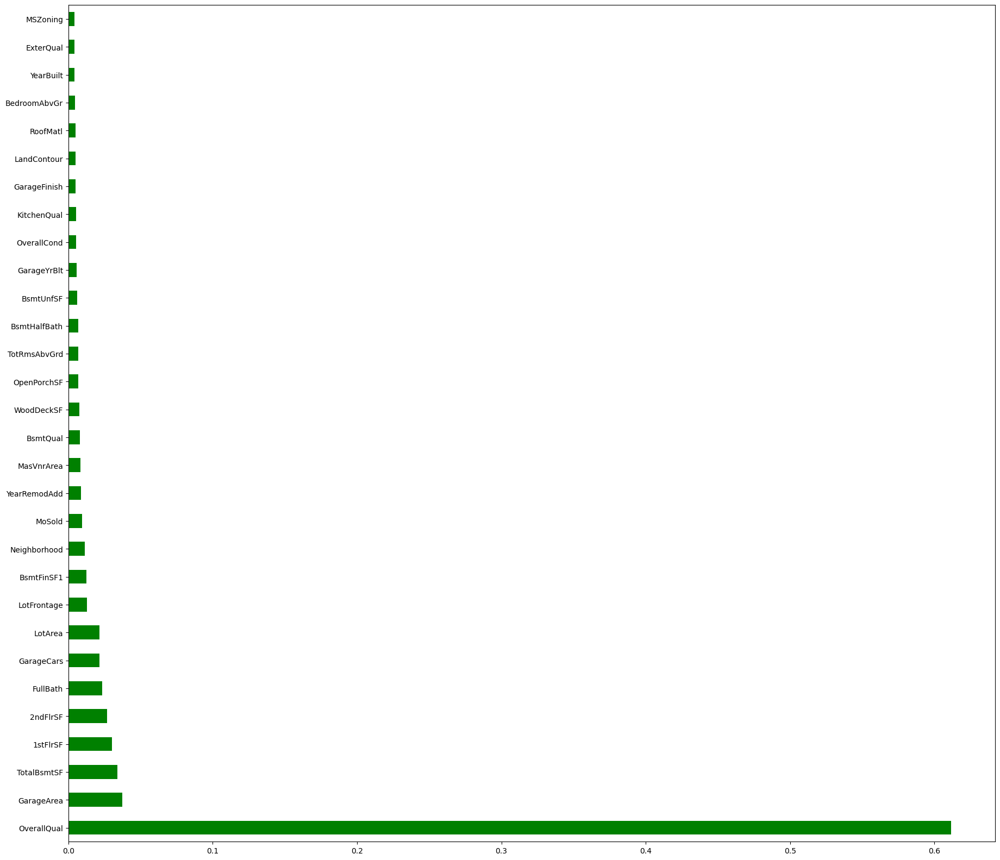

In [91]:
plt.figure(figsize=(22,20))
importances=pd.Series(RFR.feature_importances_,index=x.columns)
importances.nlargest(30).plot(kind='barh',color="g")
plt.show()

OverallQual column contributing more for prediction which means this feature is important for the predictions.

Now splitting the data for Training and Testing purpose. 70% we are considering for Training and 30% for Testing purpose

In [92]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.30,random_state=maxRS)

### Applying Regression Algorithms

##### Importing all the Regression Algorithms

In [95]:
from sklearn.ensemble import RandomForestRegressor,ExtraTreesRegressor
from sklearn.linear_model import LinearRegression, Lasso,Ridge
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor as KNN
from sklearn.svm import SVR
from sklearn.linear_model import SGDRegressor
from sklearn.ensemble import BaggingRegressor
from sklearn.ensemble import GradientBoostingRegressor
import xgboost as xgb
from sklearn.metrics import classification_report
from sklearn.model_selection import cross_val_score

### Linear Regression

In [101]:
# Checking R2 score for Linear Regression
LR = LinearRegression()
LR.fit(x_train,y_train)

# prediction
predLR=LR.predict(x_test)
R2_LR = r2_score(y_test,predLR)
print('R2_Score:',R2_LR)
print('Mean abs error:',mean_absolute_error(y_test, predLR))
print('Mean squared error:',mean_squared_error(y_test, predLR))
print('Root Mean squared error(RMSE):',np.sqrt(mean_squared_error(y_test, predLR)))

# Checking cv score for Linear Regression
lr_cv=cross_val_score(LR,x,y,cv=5).mean()
print("The CV  score for  the Linear Regression is:",lr_cv)
print("Difference between R2 Score and CV Score is:",(R2_LR - lr_cv))

R2_Score: 0.8511239302545336
Mean abs error: 21633.131279227397
Mean squared error: 896091890.2409174
Root Mean squared error(RMSE): 29934.793973583943
The CV  score for  the Linear Regression is: 0.8000760824305321
Difference between R2 Score and CV Score is: 0.05104784782400151


#### Regularization

### Lasso Regressor

In [102]:
# Checking R2 score for Lasso Regressor
lasso=Lasso()
lasso.fit(x_train,y_train)

# prediction
predlasso=lasso.predict(x_test)
R2_lasso = r2_score(y_test,predlasso)
print('R2_Score:',R2_lasso)
print('Mean abs error:',mean_absolute_error(y_test, predlasso))
print('Mean squared error:',mean_squared_error(y_test, predlasso))
print('Root Mean squared error(RMSE):',np.sqrt(mean_squared_error(y_test, predlasso)))

# Checking cv score for Lasso Regressor
lasso_cv=cross_val_score(lasso,x,y,cv=5).mean()
print("The CV  score for  the Lasso Regressor is:",lasso_cv)
print("Difference between R2 Score and CV Score is:",(R2_lasso - lasso_cv))

R2_Score: 0.8511542906795044
Mean abs error: 21630.783284400557
Mean squared error: 895909149.4508954
Root Mean squared error(RMSE): 29931.741503809888
The CV  score for  the Lasso Regressor is: 0.8001014023089423
Difference between R2 Score and CV Score is: 0.0510528883705621


### Ridge Regressor

In [103]:
# Checking R2 score for Ridge Regressor
ridge=Ridge(alpha=100)
ridge.fit(x_train,y_train)
ridge.score(x_train,y_train)

# prediction
predridge=ridge.predict(x_test)
R2_ridge = r2_score(y_test,predridge)
print('R2_Score:',R2_ridge)
print('Mean abs error:',mean_absolute_error(y_test, predridge))
print('Mean squared error:',mean_squared_error(y_test, predridge))
print('Root Mean squared error(RMSE):',np.sqrt(mean_squared_error(y_test, predridge)))

# Checking cv score for Ridge Regressor
ridge_cv=cross_val_score(ridge,x,y,cv=5).mean()
print("The CV  score for  the Ridge Regressor is:",ridge_cv)
print("Difference between R2 Score and CV Score is:",(R2_ridge - ridge_cv))

R2_Score: 0.8547640849422966
Mean abs error: 21005.556691150156
Mean squared error: 874181632.2625612
Root Mean squared error(RMSE): 29566.56274007111
The CV  score for  the Ridge Regressor is: 0.8045866288464779
Difference between R2 Score and CV Score is: 0.050177456095818695


### Decision Tree Regressor

In [105]:
# Checking R2 score for Decision Tree Regressor
DTR=DecisionTreeRegressor()
DTR.fit(x_train,y_train)

# prediction
predDTR=DTR.predict(x_test)
R2_DTR = r2_score(y_test,predDTR)
print('R2_Score:',R2_DTR)
print('Mean abs error:',mean_absolute_error(y_test, predDTR))
print('Mean squared error:',mean_squared_error(y_test, predDTR))
print('Root Mean squared error(RMSE):',np.sqrt(mean_squared_error(y_test, predDTR)))

# Checking cv score for Decision Tree Regression
DTR_cv=cross_val_score(DTR,x,y,cv=5).mean()
print('The CV score  for  the Decision Tree Regression is :',DTR_cv)
print("Difference between R2 Score and CV Score is:",(R2_DTR - DTR_cv))

R2_Score: 0.7452542499373536
Mean abs error: 27661.005698005698
Mean squared error: 1533326350.5327635
Root Mean squared error(RMSE): 39157.711252482106
The CV score  for  the Decision Tree Regression is : 0.6543564856501043
Difference between R2 Score and CV Score is: 0.09089776428724927


#### Ensemble Techniques

### Random Forest Regressor

In [104]:
# Checking R2 score for Random Forest Regressor
RFR=RandomForestRegressor()
RFR.fit(x_train,y_train)

# prediction
predRFR=RFR.predict(x_test)
R2_RFR = r2_score(y_test,predRFR)
print('R2_Score:',R2_RFR)
print('Mean abs error:',mean_absolute_error(y_test, predRFR))
print('Mean squared error:',mean_squared_error(y_test, predRFR))
print('Root Mean squared error(RMSE):',np.sqrt(mean_squared_error(y_test, predRFR)))

# Checking cv score for Random Forest Regression
RFR_cv=cross_val_score(RFR,x,y,cv=5).mean()
print("The CV  score for  the Random forest regressor is:",RFR_cv)
print("Difference between R2 Score and CV Score is:",(R2_RFR - RFR_cv))


R2_Score: 0.9040005010427254
Mean abs error: 16145.478404558407
Mean squared error: 577825386.1072576
Root Mean squared error(RMSE): 24037.99879580781
The CV  score for  the Random forest regressor is: 0.8332620470036881
Difference between R2 Score and CV Score is: 0.07073845403903734


### ExtraTrees Regressor

In [106]:
XT=ExtraTreesRegressor()
XT.fit(x_train,y_train)

#prediction
predXT=XT.predict(x_test)
R2_XT = r2_score(y_test,predXT)
print('R2_Score:',R2_XT)
print('Mean abs error:',mean_absolute_error(y_test, predXT))
print('Mean squared error:',mean_squared_error(y_test, predXT))
print('Root Mean squared error(RMSE):',np.sqrt(mean_squared_error(y_test, predXT)))

# Checking cv score for Extra Tree Regression
XT_cv=cross_val_score(XT,x,y,cv=5).mean()
print('The  CV score for the Extra Tree  regressor is :',XT_cv)
print("Difference between R2 Score and CV Score is:",(R2_XT - XT_cv))

R2_Score: 0.888902782496671
Mean abs error: 16988.74641025641
Mean squared error: 668699246.314541
Root Mean squared error(RMSE): 25859.219754558355
The  CV score for the Extra Tree  regressor is : 0.8416485754869332
Difference between R2 Score and CV Score is: 0.047254207009737814


### Gradient Boosting Regressor

In [108]:
GBR=GradientBoostingRegressor()
GBR.fit(x_train,y_train)

#prediction
predGBR=GBR.predict(x_test)
R2_GBR = r2_score(y_test,predGBR)
print('R2_Score:',R2_GBR)
print('Mean abs error:',mean_absolute_error(y_test, predGBR))
print('Mean squared error:',mean_squared_error(y_test, predGBR))
print('Root Mean squared error(RMSE):',np.sqrt(mean_squared_error(y_test, predGBR)))

# Checking cv score for GBR Regression
GBR_cv=cross_val_score(GBR,x,y,cv=5).mean()
print('The  CV score for the GradientBoosting  regressor is :',GBR_cv)
print("Difference between R2 Score and CV Score is:",(R2_GBR - GBR_cv))

R2_Score: 0.9146628924161928
Mean abs error: 15363.503735728684
Mean squared error: 513647963.5256824
Root Mean squared error(RMSE): 22663.80293608472
The  CV score for the GradientBoosting  regressor is : 0.8327950594535043
Difference between R2 Score and CV Score is: 0.08186783296268851


### Bagging Regressor

In [109]:
BR=BaggingRegressor()
BR.fit(x_train,y_train)

#prediction
predBR=BR.predict(x_test)
R2_BR = r2_score(y_test,predBR)
print('R2_Score:',R2_BR)
print('Mean abs error:',mean_absolute_error(y_test, predBR))
print('Mean squared error:',mean_squared_error(y_test, predBR))
print('Root Mean squared error(RMSE):',np.sqrt(mean_squared_error(y_test, predBR)))

# Checking cv score for Bagging Regression
BR_cv=cross_val_score(BR,x,y,cv=5).mean()
print('The  CV score for the Bagging  regressor is :',BR_cv)
print("Difference between R2 Score and CV Score is:",(R2_BR - BR_cv))

R2_Score: 0.8799456405877624
Mean abs error: 18627.019658119658
Mean squared error: 722612694.1778063
Root Mean squared error(RMSE): 26881.456325463587
The  CV score for the Bagging  regressor is : 0.8134400877924467
Difference between R2 Score and CV Score is: 0.06650555279531567


### Extreme Gradient Boosting Regressor (XGB)

In [110]:
from xgboost import XGBRegressor as xgb

XGB=xgb(verbosity=0)
XGB.fit(x_train,y_train)

#prediction
predXGB=XGB.predict(x_test)
R2_XGB = r2_score(y_test,predXGB)
print('R2_Score:',r2_score(y_test,predXGB))
print('Mean abs error:',mean_absolute_error(y_test, predXGB))
print('Mean squared error:',mean_squared_error(y_test, predXGB))
print('Root Mean squared error(RMSE):',np.sqrt(mean_squared_error(y_test, predXGB)))

# Checking cv score for Extra Tree Regression
XGB_cv=cross_val_score(XGB,x,y,cv=5).mean()
print('The  CV score for the Extra Tree  regressor is :',XGB_cv)
print("Difference between R2 Score and CV Score is:",(R2_XGB - XGB_cv))

R2_Score: 0.8855630761867528
Mean abs error: 17977.474982193733
Mean squared error: 688801091.7301321
Root Mean squared error(RMSE): 26245.020322532273
The  CV score for the Extra Tree  regressor is : 0.8363245384640596
Difference between R2 Score and CV Score is: 0.049238537722693154


From the above observation, looking at the difference of R2 score and the cross validation score we conclude that ExtraTrees Regressor is our best fitting model

## Hyperparameter tuning

In [111]:
from sklearn.model_selection import GridSearchCV

In [112]:
# Choosing Extra Trees Regressor

parameters = {'n_estimators' : [100, 200, 300],
              'criterion' : ['squared_error', 'mse', 'absolute_error', 'mae'],
              'n_jobs' : [-2, -1, 1],
              'random_state' : [50, 100, 150, 200, 250, 300]
             }

In [113]:
GCV=GridSearchCV(ExtraTreesRegressor(),parameters,cv=5)

In [114]:
GCV.fit(x_train,y_train)

exception calling callback for <Future at 0x198959effa0 state=finished raised KeyError>
Traceback (most recent call last):
  File "C:\ProgramData\Anaconda3\lib\site-packages\joblib\externals\loky\_base.py", line 625, in _invoke_callbacks
    callback(self)
  File "C:\ProgramData\Anaconda3\lib\site-packages\joblib\parallel.py", line 359, in __call__
    self.parallel.dispatch_next()
  File "C:\ProgramData\Anaconda3\lib\site-packages\joblib\parallel.py", line 794, in dispatch_next
    if not self.dispatch_one_batch(self._original_iterator):
  File "C:\ProgramData\Anaconda3\lib\site-packages\joblib\parallel.py", line 861, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\ProgramData\Anaconda3\lib\site-packages\joblib\parallel.py", line 779, in _dispatch
    job = self._backend.apply_async(batch, callback=cb)
  File "C:\ProgramData\Anaconda3\lib\site-packages\joblib\_parallel_backends.py", line 531, in apply_async
    future = self._workers.submit(SafeFunction(func))
  File "C:\Pr

GridSearchCV(cv=5, estimator=ExtraTreesRegressor(),
             param_grid={'criterion': ['squared_error', 'mse', 'absolute_error',
                                       'mae'],
                         'n_estimators': [100, 200, 300], 'n_jobs': [-2, -1, 1],
                         'random_state': [50, 100, 150, 200, 250, 300]})

In [115]:
GCV.best_params_

{'criterion': 'mse', 'n_estimators': 100, 'n_jobs': -2, 'random_state': 200}

In [118]:
Final_model = ExtraTreesRegressor(criterion='mse', n_estimators=100, n_jobs=-2, random_state=200)
Final_model.fit(x_train, y_train)
pred_GCV = Final_model.predict(x_test)
print('R2_Score:',r2_score(y_test,pred_GCV)*100)
print('Mean abs error:',mean_absolute_error(y_test, pred_GCV))
print('Mean squared error:',mean_squared_error(y_test, pred_GCV))
print('Root Mean squared error(RMSE):',np.sqrt(mean_squared_error(y_test, pred_GCV)))

R2_Score: 88.873280681476
Mean abs error: 16935.58304843305
Mean squared error: 669722337.7378904
Root Mean squared error(RMSE): 25878.99414076773


After Hyperparameter tuning R2 score of our best model is 88.87%.

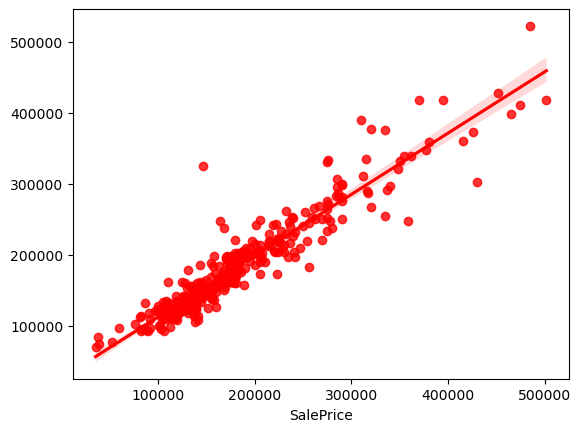

In [122]:
# Visualizing the predicteed values
sns.regplot(y_test,pred_GCV,color="r")
plt.show()

## Saving the final model

In [119]:
# Saving the model using .pkl
import joblib
joblib.dump(Final_model,"Housing_Price_Prediction.pkl")

['Housing_Price_Prediction.pkl']

In [120]:
# Loading the saved model
import joblib
Model=joblib.load("Housing_Price_Prediction.pkl")

#Prediction
prediction = Model.predict(x_test)
prediction

array([131619.49, 177654.69, 112315.14, 238049.9 , 138506.81, 102723.65,
        94117.38, 376263.14, 243661.44, 233876.85, 287794.38, 125268.5 ,
       201218.71, 199795.18, 161039.87, 202241.33, 158244.03, 218290.05,
       165163.73, 150697.46, 164935.04, 376821.75, 199077.85, 219130.06,
       114185.82, 135530.25, 162141.  , 228719.83, 122744.  , 140328.  ,
       334182.95, 202624.71, 135244.8 , 203643.18,  93228.94, 197441.03,
       160318.5 ,  83920.  , 160752.  , 200662.36, 207951.61, 204442.67,
       155547.73, 198572.48, 196346.54, 181902.27, 252808.08, 193996.72,
       174837.4 , 174968.62, 162349.02,  74263.79, 173589.93, 120619.66,
       108243.25, 252601.92, 320461.63, 140814.  ,  97110.  , 213950.75,
        97971.66,  93068.  , 171458.21, 389570.14, 155899.5 , 203303.4 ,
       330341.55,  97067.43, 149644.69, 160492.  , 198546.44, 206806.84,
        95162.53, 247111.32, 170837.56, 226255.71, 132217.  , 204492.77,
       248071.24, 143393.1 , 522433.16, 121784.95, 

In [121]:
pd.DataFrame([Model.predict(x_test)[:],y_test[:]],index=["Predicted","Original"]).T

,Predicted,Original
0,131619.49,137000.0
1,177654.69,168500.0
2,112315.14,115000.0
3,238049.90,280000.0
4,138506.81,140000.0
5,102723.65,76000.0
6,94117.38,88000.0
7,376263.14,335000.0
8,243661.44,222000.0
9,233876.85,227000.0


# Test Data for predicting SalePrice

In [123]:
df_test = pd.read_csv("Project-Housing_splitted/test.csv")
df_test

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,337,20,RL,86.0,14157,Pave,NaN,IR1,HLS,AllPub,Corner,Gtl,StoneBr,Norm,Norm,1Fam,1Story,9,5,2005,2006,Hip,CompShg,VinylSd,VinylSd,Stone,200.0,Gd,TA,PConc,Ex,TA,Gd,GLQ,1249,Unf,0,673,1922,GasA,Ex,Y,SBrkr,1922,0,0,1922,1,0,2,0,3,1,Gd,8,Typ,1,Gd,Attchd,2005.0,Fin,3,676,TA,TA,Y,178,51,0,0,0,0,NaN,NaN,NaN,0,7,2007,WD,Normal
1,1018,120,RL,NaN,5814,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,1984,1984,Gable,CompShg,HdBoard,HdBoard,None,0.0,Gd,TA,CBlock,Gd,TA,Av,GLQ,1036,Unf,0,184,1220,GasA,Gd,Y,SBrkr,1360,0,0,1360,1,0,1,0,1,1,Gd,4,Typ,1,Ex,Attchd,1984.0,RFn,2,565,TA,TA,Y,63,0,0,0,0,0,NaN,NaN,NaN,0,8,2009,COD,Abnorml
2,929,20,RL,NaN,11838,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,1Story,8,5,2001,2001,Hip,CompShg,VinylSd,VinylSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,Unf,0,Unf,0,1753,1753,GasA,Ex,Y,SBrkr,1788,0,0,1788,0,0,2,0,3,1,Ex,7,Typ,1,TA,Attchd,2001.0,RFn,2,522,TA,TA,Y,202,151,0,0,0,0,NaN,NaN,NaN,0,6,2009,WD,Normal
3,1148,70,RL,75.0,12000,Pave,NaN,Reg,Bnk,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,7,1941,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,275,Unf,0,429,704,GasA,Ex,Y,SBrkr,860,704,0,1564,0,0,1,1,3,1,Fa,7,Typ,1,Gd,Attchd,1941.0,Unf,1,234,TA,TA,Y,0,0,0,0,0,0,NaN,NaN,NaN,0,7,2009,WD,Normal
4,1227,60,RL,86.0,14598,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,Somerst,Feedr,Norm,1Fam,2Story,6,5,2007,2007,Gable,CompShg,VinylSd,VinylSd,Stone,74.0,Gd,TA,PConc,Gd,TA,Mn,Unf,0,Unf,0,894,894,GasA,Ex,Y,SBrkr,894,1039,0,1933,0,0,2,1,4,1,Gd,9,Typ,1,Gd,BuiltIn,2007.0,Fin,3,668,TA,TA,Y,100,18,0,0,0,0,NaN,NaN,NaN,0,1,2008,WD,Normal
5,650,180,RM,21.0,1936,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,MeadowV,Norm,Norm,Twnhs,SFoyer,4,6,1970,1970,Gable,CompShg,CemntBd,CmentBd,None,0.0,TA,TA,CBlock,Gd,TA,Av,BLQ,131,GLQ,499,0,630,GasA,Gd,Y,SBrkr,630,0,0,630,1,0,1,0,1,1,TA,3,Typ,0,NaN,NaN,NaN,NaN,0,0,NaN,NaN,Y,0,0,0,0,0,0,NaN,MnPrv,NaN,0,12,2007,WD,Normal
6,1453,180,RM,35.0,3675,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Norm,Norm,TwnhsE,SLvl,5,5,2005,2005,Gable,CompShg,VinylSd,VinylSd,BrkFace,80.0,TA,TA,PConc,Gd,TA,Gd,GLQ,547,Unf,0,0,547,GasA,Gd,Y,SBrkr,1072,0,0,1072,1,0,1,0,2,1,TA,5,Typ,0,NaN,Basment,2005.0,Fin,2,525,TA,TA,Y,0,28,0,0,0,0,NaN,NaN,NaN,0,5,2006,WD,Normal
7,152,20,RL,107.0,13891,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NridgHt,Norm,Norm,1Fam,1Story,8,5,2007,2008,Hip,CompShg,VinylSd,VinylSd,Stone,436.0,Gd,TA,PConc,Ex,TA,Gd,GLQ,1400,Unf,0,310,1710,GasA,Ex,Y,SBrkr,1710,0,0,1710,1,0,2,0,2,1,Gd,6,Typ,1,Gd,Attchd,2007.0,RFn,3,866,TA,TA,Y,0,102,0,0,0,0,NaN,NaN,NaN,0,1,2008,New,Partial
8,427,80,RL,NaN,12800,Pave,NaN,Reg,Low,AllPub,Inside,Mod,SawyerW,Norm,Norm,1Fam,SLvl,7,5,1989,1989,Gable,CompShg,Wd Sdng,Wd Sdng,BrkFace,145.0,Gd,TA,PConc,Gd,TA,Gd,GLQ,1518,Unf,0,0,1518,GasA,Gd,Y,SBrkr,1644,0,0,1644,1,1,2,0,2,1,Gd,5,Typ,1,TA,Attchd,1989.0,Fin,2,569,TA,TA,Y,80,0,0,0,396,0,NaN,NaN,NaN,0,8,2009,WD,Normal
9,776,120,RM,32.0,4500,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Mitchel,Norm,Norm,TwnhsE,1Story,6,5,1998,1998,Hip,CompShg,VinylSd,VinylSd,BrkFace,320.0,TA,TA,PConc,Ex,TA,No,GLQ,866,Unf,0,338,1204,GasA,Ex,Y,SBrkr,1204,0,0,1204,1,0,2,0,2,1,TA,5,Typ,0,NaN,Attchd,1998.0,Fin,2,412,TA,TA,

In [124]:
df_test.shape

(292, 80)

In test dataset 292 rows and 80 columns are there.

In [125]:
df_test.isnull().sum()

Id                 0
MSSubClass         0
MSZoning           0
LotFrontage       45
LotArea            0
Street             0
Alley            278
LotShape           0
LandContour        0
Utilities          0
LotConfig          0
LandSlope          0
Neighborhood       0
Condition1         0
Condition2         0
BldgType           0
HouseStyle         0
OverallQual        0
OverallCond        0
YearBuilt          0
YearRemodAdd       0
RoofStyle          0
RoofMatl           0
Exterior1st        0
Exterior2nd        0
MasVnrType         1
MasVnrArea         1
ExterQual          0
ExterCond          0
Foundation         0
BsmtQual           7
BsmtCond           7
BsmtExposure       7
BsmtFinType1       7
BsmtFinSF1         0
BsmtFinType2       7
BsmtFinSF2         0
BsmtUnfSF          0
TotalBsmtSF        0
Heating            0
HeatingQC          0
CentralAir         0
Electrical         1
1stFlrSF           0
2ndFlrSF           0
LowQualFinSF       0
GrLivArea          0
BsmtFullBath 

Many columns has null values.Let's check the missing value percentage

In [126]:
print("Missing column values in percentage:")
for col in df_test:
    percentage = np.round((df_test[col].isnull().sum()/df_test.shape[0])*100, 3)
    print(col, ":".format(), percentage, '%')

Missing column values in percentage:
Id : 0.0 %
MSSubClass : 0.0 %
MSZoning : 0.0 %
LotFrontage : 15.411 %
LotArea : 0.0 %
Street : 0.0 %
Alley : 95.205 %
LotShape : 0.0 %
LandContour : 0.0 %
Utilities : 0.0 %
LotConfig : 0.0 %
LandSlope : 0.0 %
Neighborhood : 0.0 %
Condition1 : 0.0 %
Condition2 : 0.0 %
BldgType : 0.0 %
HouseStyle : 0.0 %
OverallQual : 0.0 %
OverallCond : 0.0 %
YearBuilt : 0.0 %
YearRemodAdd : 0.0 %
RoofStyle : 0.0 %
RoofMatl : 0.0 %
Exterior1st : 0.0 %
Exterior2nd : 0.0 %
MasVnrType : 0.342 %
MasVnrArea : 0.342 %
ExterQual : 0.0 %
ExterCond : 0.0 %
Foundation : 0.0 %
BsmtQual : 2.397 %
BsmtCond : 2.397 %
BsmtExposure : 2.397 %
BsmtFinType1 : 2.397 %
BsmtFinSF1 : 0.0 %
BsmtFinType2 : 2.397 %
BsmtFinSF2 : 0.0 %
BsmtUnfSF : 0.0 %
TotalBsmtSF : 0.0 %
Heating : 0.0 %
HeatingQC : 0.0 %
CentralAir : 0.0 %
Electrical : 0.342 %
1stFlrSF : 0.0 %
2ndFlrSF : 0.0 %
LowQualFinSF : 0.0 %
GrLivArea : 0.0 %
BsmtFullBath : 0.0 %
BsmtHalfBath : 0.0 %
FullBath : 0.0 %
HalfBath : 0.0 %
Be

Looking at the missing value percentage, we will drop columns that have most of the null values

In [127]:
df_test.drop(["Alley", "FireplaceQu", "PoolQC", "Fence", "MiscFeature"], axis=1, inplace=True)

In [128]:
df_test.drop(["Id", "Utilities"], axis=1, inplace=True)

In [129]:
#Filling the null values by mean and mode method

for i in mode:
    df_test[i] = df_test[i].fillna(df_test[i].mode()[0])
    
for j in mean:
    df_test[j] = df_test[j].fillna(df_test[j].mean())
    
print("Missing values count after filling the data")
print(df_test.isna().sum())

Missing values count after filling the data
MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
Street           0
LotShape         0
LandContour      0
LotConfig        0
LandSlope        0
Neighborhood     0
Condition1       0
Condition2       0
BldgType         0
HouseStyle       0
OverallQual      0
OverallCond      0
YearBuilt        0
YearRemodAdd     0
RoofStyle        0
RoofMatl         0
Exterior1st      0
Exterior2nd      0
MasVnrType       0
MasVnrArea       0
ExterQual        0
ExterCond        0
Foundation       0
BsmtQual         0
BsmtCond         0
BsmtExposure     0
BsmtFinType1     0
BsmtFinSF1       0
BsmtFinType2     0
BsmtFinSF2       0
BsmtUnfSF        0
TotalBsmtSF      0
Heating          0
HeatingQC        0
CentralAir       0
Electrical       1
1stFlrSF         0
2ndFlrSF         0
LowQualFinSF     0
GrLivArea        0
BsmtFullBath     0
BsmtHalfBath     0
FullBath         0
HalfBath         0
BedroomAbvGr     0
KitchenAbvGr     0
Kitche

I have applied all the pre processing methods that were used on training dataset to treat the null values from our testing dataset too.

In [131]:
df_test.dropna(inplace=True) #To make sure there is no null values

In [132]:
# Encoding test dataframe using OrdinalEncoder
from sklearn.preprocessing import OrdinalEncoder
enc = OrdinalEncoder()
for i in df_test.columns:
    if df_test[i].dtypes == "object":
        df_test[i] = enc.fit_transform(df_test[i].values.reshape(-1,1))

#### Outliers

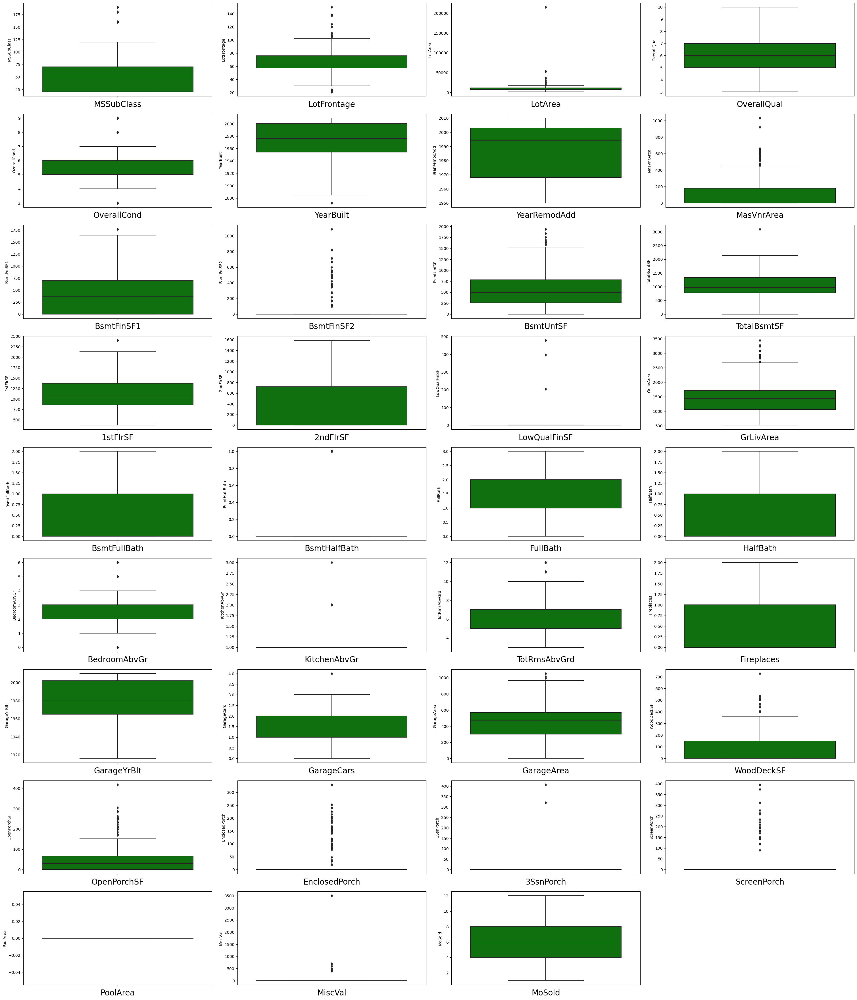

In [133]:
#Let's check the Outliers through Boxplot

plt.figure(figsize=(30,35), facecolor='white')
plotnumber = 1

for column in Num_data:
    if plotnumber<=35:
        ax = plt.subplot(9,4,plotnumber)
        sns.boxplot(y=column, data=df_test,color='g')
        plt.xlabel(column,fontsize=20)
    plotnumber+=1
plt.tight_layout(pad=0.1, w_pad=0.5, h_pad=1.0)
plt.show()

In [135]:
# Removing outliers in test data using percentile method 
for col in df1:
    if df_test[col].dtypes != 'object':
        percentile = df_test[col].quantile([0.01,0.98]).values
        df_test[col][df_test[col]<=percentile[0]]=percentile[0]
        df_test[col][df_test[col]>=percentile[1]]=percentile[1]

#### Skewness

In [136]:
df_test.skew()

MSSubClass        1.328038
MSZoning          0.184048
LotFrontage      -0.013306
LotArea           1.273383
Street          -11.999568
LotShape         -0.633651
LandContour      -3.325302
LotConfig        -1.199390
LandSlope         4.630097
Neighborhood      0.047640
Condition1        2.803900
Condition2       17.058722
BldgType          1.991549
HouseStyle        0.386222
OverallQual       0.391432
OverallCond       1.204544
YearBuilt        -0.751861
YearRemodAdd     -0.531093
RoofStyle         1.381014
RoofMatl         13.693928
Exterior1st      -0.637928
Exterior2nd      -0.667435
MasVnrType        0.041397
MasVnrArea        1.541161
ExterQual        -1.915638
ExterCond        -3.587674
Foundation        0.387589
BsmtQual         -1.350004
BsmtCond         -4.860309
BsmtExposure     -1.283834
BsmtFinType1      0.046915
BsmtFinSF1        0.635716
BsmtFinType2     -3.694747
BsmtFinSF2        3.690979
BsmtUnfSF         0.868672
TotalBsmtSF       0.148822
Heating           8.198130
H

In [ ]:
# Dropping irrelevant colum
df_test.drop("KitchenAbvGr",axis=1,inplace=True)
df_test.drop("PoolArea",axis=1,inplace=True)
df_test.drop("3SsnPorch",axis=1,inplace=True)


In [146]:
df_test.drop("MiscVal",axis=1,inplace=True)

In [148]:
# Removing skewness using yeo-johnson  method to get better prediction
skew2 = ["MSSubClass","LotArea","MasVnrArea","BsmtFinSF1","BsmtUnfSF","1stFlrSF","2ndFlrSF","HalfBath","TotRmsAbvGrd","Fireplaces","WoodDeckSF","OpenPorchSF","EnclosedPorch", "ScreenPorch"]

from sklearn.preprocessing import PowerTransformer
scaler = PowerTransformer(method='yeo-johnson')
'''
parameters:
method = 'box-cox' or 'yeo-johnson'
'''

"\nparameters:\nmethod = 'box-cox' or 'yeo-johnson'\n"

In [138]:
df_test[skew2] = scaler.fit_transform(df_test[skew2].values)
df_test[skew2].head()

,MSSubClass,LotArea,MasVnrArea,BsmtFinSF1,BsmtUnfSF,1stFlrSF,2ndFlrSF,HalfBath,TotRmsAbvGrd,Fireplaces,WoodDeckSF,OpenPorchSF,EnclosedPorch,ScreenPorch,MiscVal
0,-1.147386,1.010140,1.180992,1.213710,0.458062,1.831638,-0.866891,-0.734474,0.982122,0.804089,1.124320,0.715295,-0.393397,-0.278887,-0.188646
1,1.342043,-0.875558,-0.849063,1.070548,-0.847055,0.744329,-0.866891,-0.734474,-1.610940,0.804089,0.820906,-1.116004,-0.393397,-0.278887,-0.188646
2,-1.147386,0.564818,-0.849063,-1.382318,1.995370,1.605830,-0.866891,-0.734474,0.450710,0.804089,1.158759,1.287037,-0.393397,-0.278887,-0.188646
3,0.710200,0.597345,-0.849063,0.228232,-0.095164,-0.722205,1.142695,1.356000,0.450710,0.804089,-0.910495,-1.116004,-0.393397,-0.278887,-0.188646
4,0.512126,1.090358,0.948635,-1.382318,0.877962,-0.596988,1.215644,1.356000,1.462612,0.804089,0.960458,0.209229,-0.393397,-0.278887,-0.188646


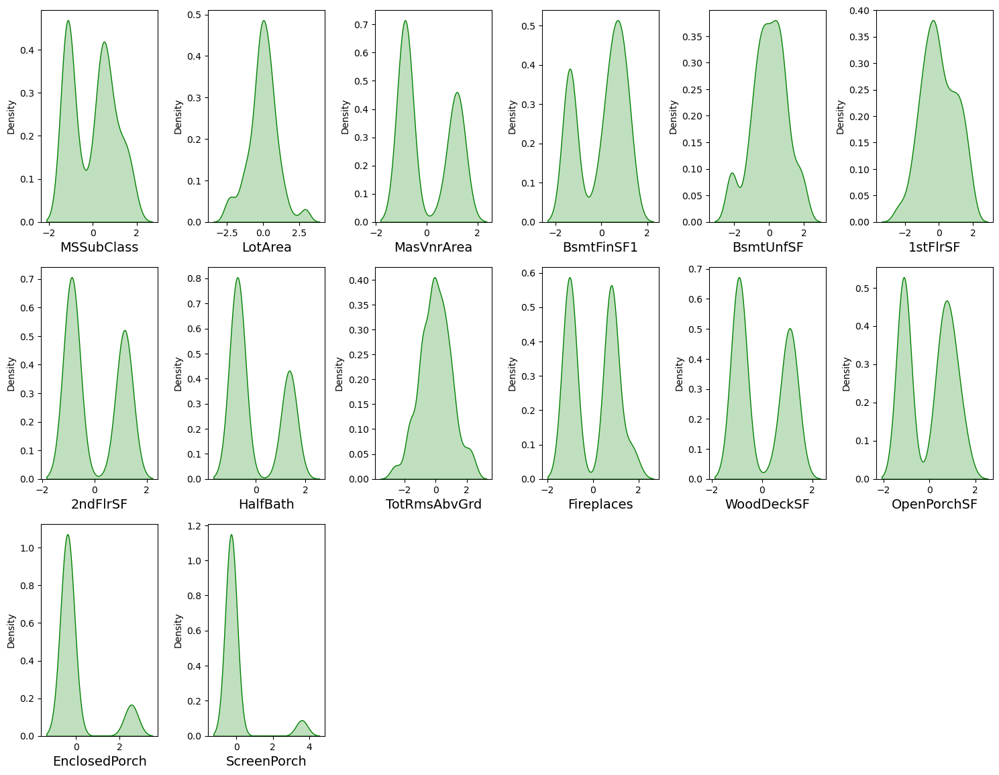

In [149]:
# Checking how the data has been distriubted in each column after removing skewness

plt.figure(figsize=(15,15),facecolor='white')
plotnumber=1
for column in df_test[skew2] :
    if plotnumber<=21:
        ax=plt.subplot(4,6,plotnumber)
        sns.distplot(df_test[column],color="g",kde_kws={"shade": True},hist=False)
        plt.xlabel(column,fontsize=14)
    plotnumber+=1
plt.tight_layout()
plt.show()

In [150]:
# Checking skewness after using yeo-johnson method
df_test[skew2].skew()

MSSubClass       0.091047
LotArea          0.075051
MasVnrArea       0.356953
BsmtFinSF1      -0.452199
BsmtUnfSF       -0.250089
1stFlrSF         0.003116
2ndFlrSF         0.291941
HalfBath         0.631302
TotRmsAbvGrd     0.000614
Fireplaces       0.072991
WoodDeckSF       0.215297
OpenPorchSF     -0.069098
EnclosedPorch    2.159726
ScreenPorch      3.323958
dtype: float64

## Predicting the Saved model

In [151]:
import joblib
Model=joblib.load("Housing_Price_Prediction.pkl")

#Prediction
prediction = Model.predict(df_test)
prediction

array([333930.07, 402022.68, 391082.7 , 451018.92, 384529.38, 451070.59,
       365243.76, 372789.28, 372700.43, 322531.23, 445017.55, 463429.26,
       420089.53, 443226.49, 371073.72, 473174.36, 453300.51, 488249.01,
       472848.55, 387978.  , 488651.69, 444325.29, 404333.99, 373519.96,
       455341.72, 461670.26, 432933.48, 360801.78, 442745.54, 457824.29,
       426246.15, 400113.85, 362381.49, 439237.54, 449027.3 , 434976.34,
       414524.31, 477266.23, 497745.08, 504540.13, 466526.61, 391680.01,
       381462.6 , 401644.7 , 475245.02, 463919.6 , 404706.53, 421810.04,
       395348.25, 303174.2 , 489332.39, 418695.3 , 472850.89, 462508.43,
       426402.95, 466908.89, 477586.11, 377090.17, 458399.18, 403443.66,
       464081.63, 481226.08, 457296.27, 359632.44, 401750.  , 418461.72,
       482194.8 , 408270.56, 410839.76, 441133.18, 396619.77, 412687.66,
       480806.96, 483431.5 , 467954.85, 386058.49, 388735.63, 338937.75,
       400096.68, 464341.31, 335211.32, 470181.81, 

In [152]:
# Creating dataframe for the predicted results 
Prediction = pd.DataFrame()
Prediction['SalePrice']= prediction
Prediction

,SalePrice
0,333930.07
1,402022.68
2,391082.70
3,451018.92
4,384529.38
5,451070.59
6,365243.76
7,372789.28
8,372700.43
9,322531.23


# Conclusion

Which variables are important to predict the price of house?

•	Overall Quality is the most contributing and highest positive impacting feature. Also, the features like GarageArea, LotArea, 1stFlrSF, TotalBsmtSF etc have some what linear relation with the price variable.


How do these variables describe the price of the house?

•	The houses which have very excellent overall quality like material and finish of the house have high sale price. Also we have observed from the plot that as the overall quality of the house increases, the sale price also increases. That is there is good linear relation between SalePrice and OverallQual. So, if the seller builds the house according to these types of qualities that will increase the sale price of the house.
•	There is a linear relation between the SalePrice and 1stFlrSF. As we have seen as the 1st floor area increases, sales price also increases moderately. So, people like to live in the houses which have only 1-2 floors and the cost of the house also increases in this case.
•	Also, we have seen the positive linear relation between the SalePrice and GarageArea. As size of garage area increases, sale price also increases.
•	There is positive linear relation between sale price nad TotalBsmtSF. As total basement area increases, sale price also increases.
•	Using the features which have some relation with target we have built many ML models also seen the increase in accuracy of the best model.
